In [1]:
import numpy as np
import sys
import os

sys.path.insert(0,'Py3_code/') 

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt

from astropy.io import fits

from setup import *
from m0_FullFrame import FullFrame

##################
from PY3_IN_HATS34b_night1 import *   

path='/Volumes/ermay_ext/Magellan_IMACS/'+obs_date+'/'
data_path=path+obj_name+'_Spec/'      #path to where your data is saved
flat_path=path+obj_name+'_Flats/'     #path to where your SLIT flats are saved
DARKS=path+'Darks'                   #path to where your darks are saved
FLATS=path+'Full_Flats/'             #path to where the full field flats are saved 
WAVE=path+obj_name+'_Arcs/'

SAVEPATH=path+'SaveData_'+obj_name+'/'
wavelength_path=path+'WaveSolution_'+obj_name+'/'

extray=400/binny #number of extra pixels to extract per side in y direction
extrax=80/binnx  #number on the side to find wavelength strip, only for nights with a single mask

#### CHECK BINNING IN SETUP.PY ####
#### if 1x1 binning, xpixels,ypixels should be 2048,4096
#### if 2x2 binning, xpixels,ypixels should be 1024,2048
print(xpixels/binnx, ypixels/binny)

1024.0 2048.0


In [2]:
## ------------------------------------------------------------- ##
## Run this block to read header and save relevant information.  ##
## REQUIRED for observation times and number                     ##
## ------------------------------------------------------------- ##
from m0_HeaderData import *
ReadHeader(data_path,SAVEPATH)

## This cell only needs to be run ONCE. Will save to a .npz file you can read in for the arrays
## Keys in .npz file are the names of the arrays:
##'------------------------------------------'
##'   Observing Times: obs_times[n_exp]'
##'   Object Airmass:  airmass[n_exp]'
##'   Read Noise:      elc_noise[chip]'
##'   CCD Temperature: ccd_temp[chip,n_exp]'
##'   Structure Temp:  stc_temp[chip_n_exp]'
##'   Ion Pump Press:  ion_pump[chip_n_exp]'
##'------------------------------------------'

## NOTES:
##  This cell can take a few minutes to run. I'm working on speeding up the header reading process

import astropy
from astropy.time import Time

time_s=np.load(SAVEPATH+'HeaderData.npz')['obs_times']
time=Time(time_s,format='isot',scale='utc')
mid_transit=Time(midtime,format='isot',scale='utc')
time-=mid_transit
time0=np.zeros_like(time)*0.0
q=0
for i in time:
    time0[q]=np.float64(i.jd)
    q+=1
    
time0=time0.astype(float)
print(len(time0))
    
np.savez_compressed(SAVEPATH+'Obs_times.npz',times=time0)

0 %
21 %
43 %
65 %
87 %
-->> Header Data Read
------------------------------------------
   Observing Times: obs_times[n_exp]
   Exposure Times:  exp_times[n_exp]
   Object Airmass:  airmass[n_exp]
   RA:              RA[n_exp]
   DEC:             DEC[n_exp]
   Offset Angle:    Angle_o[n_exp]
   Encoder Angle:   Angle_e[n_exp]
   Read Noise:      elc_noise[chip]
   CCD Temperature: ccd_temp[chip,n_exp]
   Structure Temp:  stc_temp[chip_n_exp]
   Ion Pump Press:  ion_pump[chip_n_exp]
------------------------------------------


 CHIP ALIGNMENT:
---------------------------------
|   6   |   5   |   8   |   7   |
---------------------------------
|   1   |   2   |   3   |   4   |
---------------------------------
 
------------------------------
 Working on chips 6 & 1
------------------------------
   -->>  DATA STITCHED


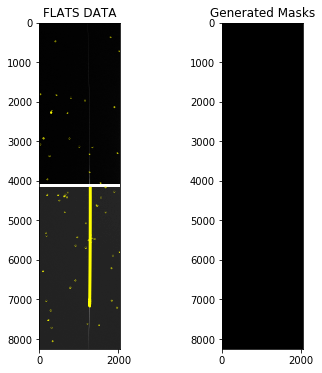

 
------------------------------
 Working on chips 5 & 2
------------------------------
   -->>  DATA STITCHED


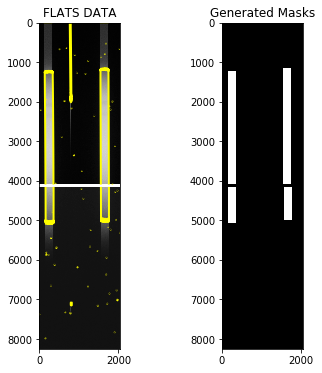

 
------------------------------
 Working on chips 8 & 3
------------------------------
   -->>  DATA STITCHED


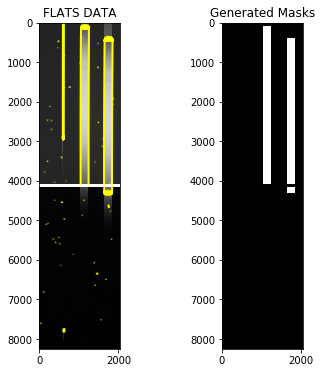

 
------------------------------
 Working on chips 7 & 4
------------------------------
   -->>  DATA STITCHED


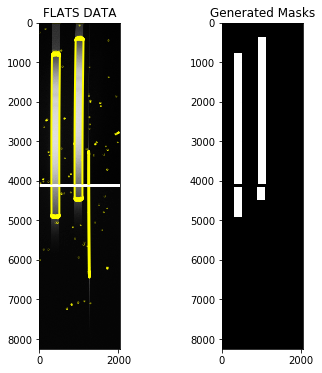

 -->> Combining Masks


Py3_code/m1_FindMasks.py:114: UserWarning: The following kwargs were not used by contour: 'color', 'linewidth'
  cs=ax0.contour(X,Y,mask_full[0,:,:],levels=[0.99],color='red',linewidth=2.0)


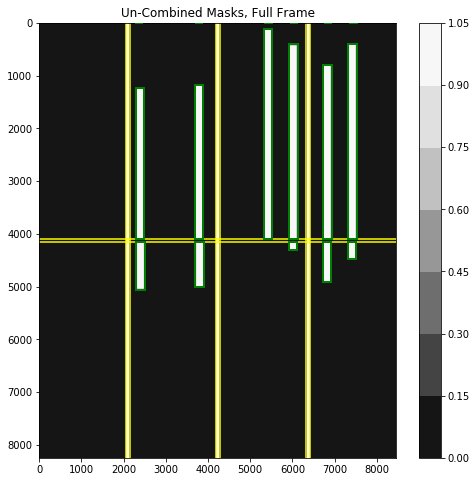

Py3_code/m1_FindMasks.py:194: UserWarning: The following kwargs were not used by contour: 'color', 'linewidth'
  cs=ax1.contour(X,Y,mask_full[0,:,:],levels=[0.99],color='red',linewidth=2.0)


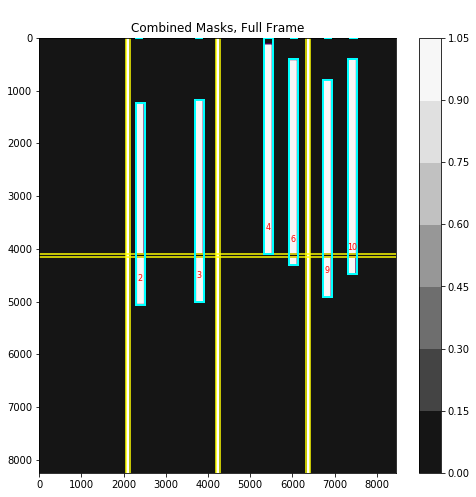

          (done)


In [2]:
## ------------------------------------------------------------- ##
## Masks are simply matrices of 1s and 0s                        ##
## ------------------------------------------------------------- ##

## user input needed:
#16 for wasp4
#34 for wasp52_1
#12 for wasp52_2
#6 for hats8_1
flat_root='ift0027c'         #root name of a slit flat image
flat_thres=6000.             #flat threshold: number of counts for 'edges' of masks.

#you may need to change the flat_thres value until you like the sizes of the extracted regions.

from m1_FindMasks import FindMasks
from m1_FindMasks import CombineMasks
#from FullFrame import FullFrame


masks=FindMasks(flat_path,flat_root,flat_thres,SAVEPATH,1,1)
mask_full=FullFrame(1,masks,1,1)
del masks

print(' -->> Combining Masks')
mask_edges=CombineMasks(mask_full,SAVEPATH,1,1)
print('          (done)')

del mask_edges

# NOTES:
# I need to find a way to ignore 0th order boxes. These can be trimmed later, for now
# this will be updated to be dependent on the median level of counts found

## last plot is sometimes small? don't know why... double click to zoom 

In [3]:
## ------------------------------------------------------------- ##
##  This rearranges masks so that the [0] element is the target  ##
##  zero-th order masks are also removed.                        ##
## ------------------------------------------------------------- ##

## using numbers output on combined mask image from cell above,define the following:
TAR=3                        #index for target
FIR=np.array([0,1,5,7,8])#([2,6,7,8,9,10,14,15])#[0,1,2,3,9,10,14])     #indices for zeroth order masks. These will be deleted


################## don't change below  ################
mask_edges=np.load(SAVEPATH+'CombinedMasks.npz')['mask_edges']
masks_fin=np.empty([mask_edges.shape[0]-len(FIR),mask_edges.shape[1]])*0.0

masks_fin[0,:]=mask_edges[TAR,:]
j=1
for i in range(0,mask_edges.shape[0]):
    if not i in FIR and i!=TAR:
        masks_fin[j,:]=mask_edges[i,:]
        j+=1
        
np.savez_compressed(SAVEPATH+'FinalMasks.npz',masks=masks_fin)




 -->> Loading Masks
          (done)


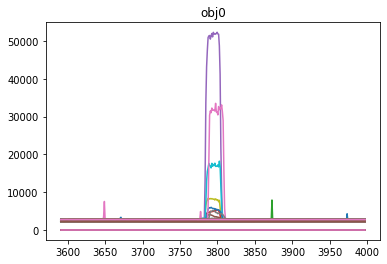

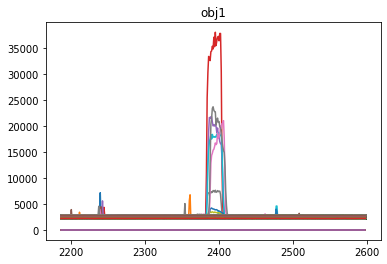

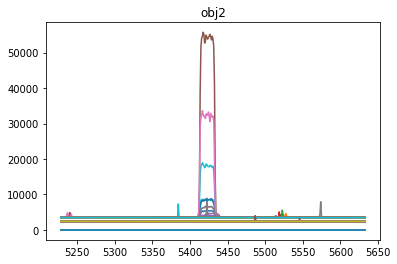

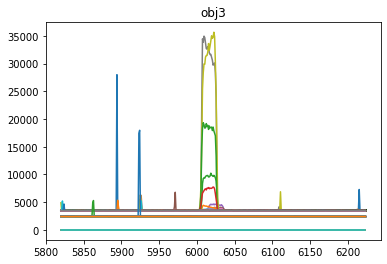

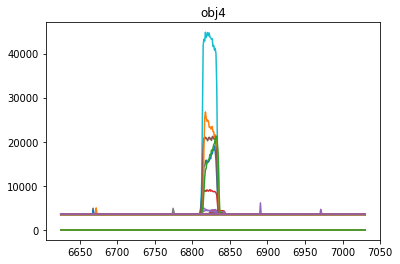

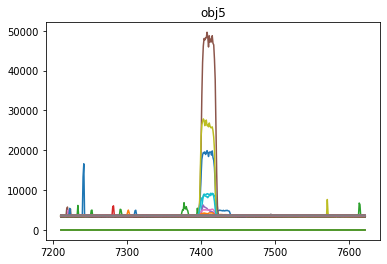

In [2]:
from m2_WaveExtract import *

DetermineSide(5,path+obj_name+'_Arcs_He/',extray,100,SAVEPATH)

*************
  OBJECT  0
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


/Users/mayem1/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1115: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


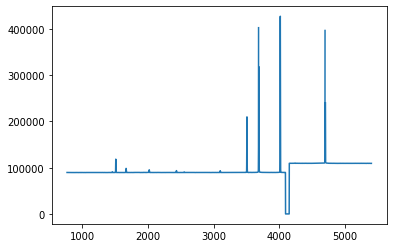

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


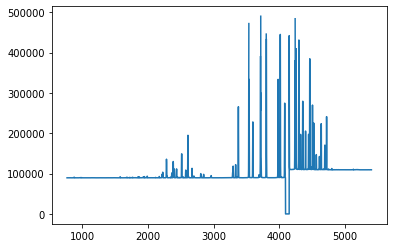

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


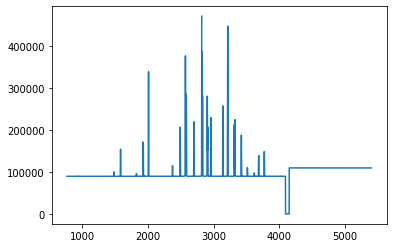

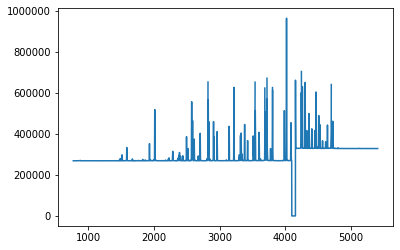

*************
  OBJECT  1
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


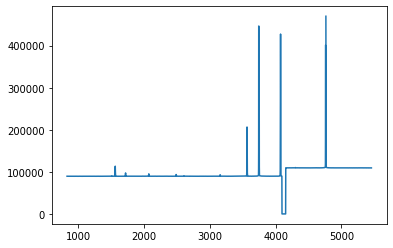

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


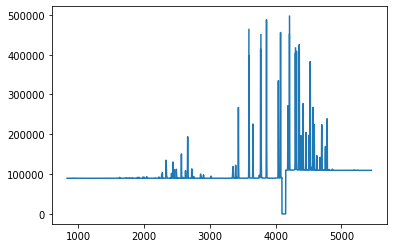

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


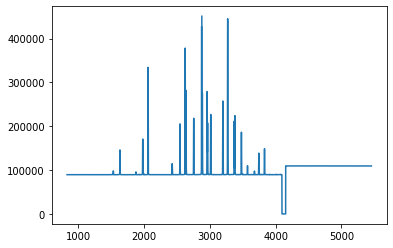

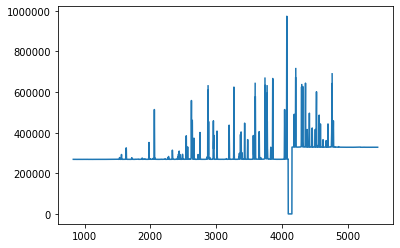

*************
  OBJECT  2
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


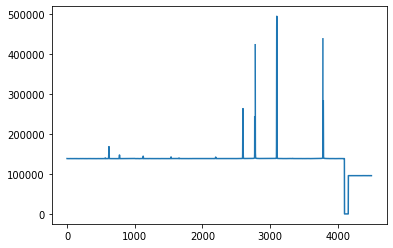

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


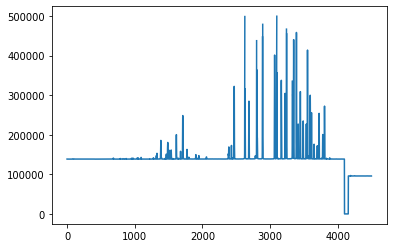

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


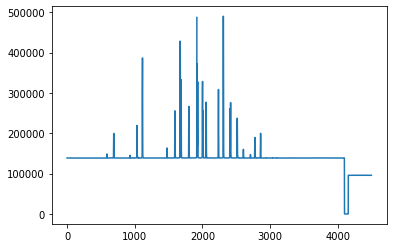

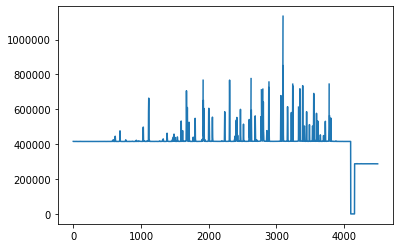

*************
  OBJECT  3
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


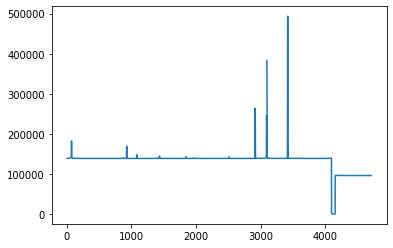

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


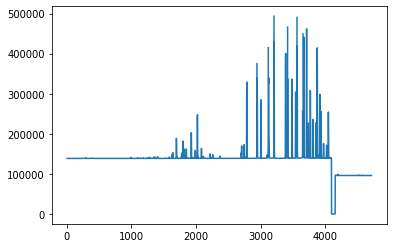

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


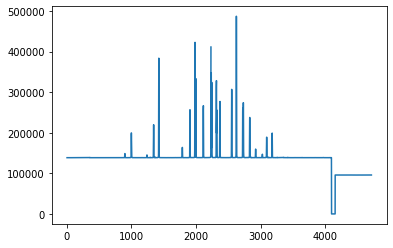

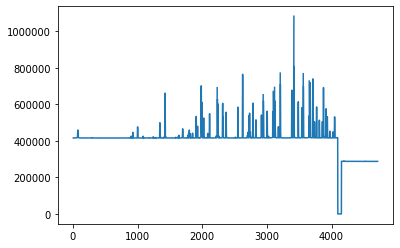

*************
  OBJECT  4
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


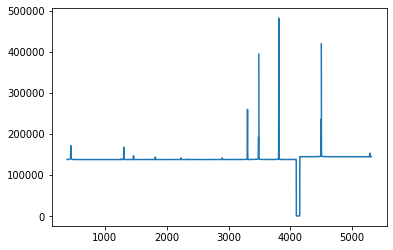

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


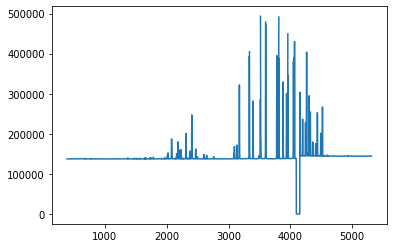

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


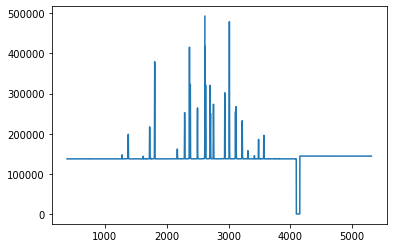

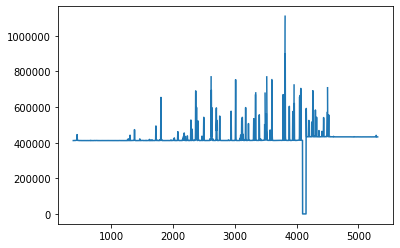

*************
  OBJECT  5
*************
-------------
He
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5


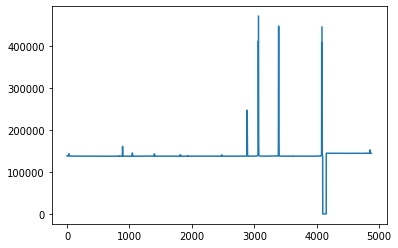

-------------
Ne
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


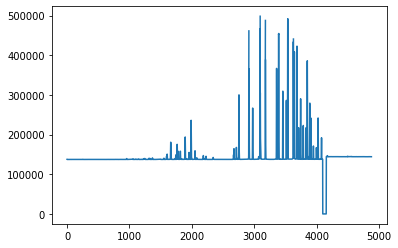

-------------
Ar
 -->> Loading Masks
          (done)
  -->> EXPOSURE #  1
  -->> EXPOSURE #  2
  -->> EXPOSURE #  3
  -->> EXPOSURE #  4
  -->> EXPOSURE #  5
  -->> EXPOSURE #  6
  -->> EXPOSURE #  7
  -->> EXPOSURE #  8
  -->> EXPOSURE #  9
  -->> EXPOSURE #  10


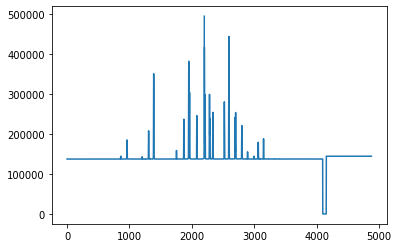

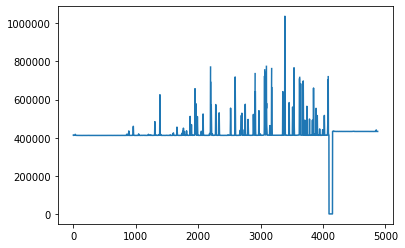

In [4]:
side=['center','center','center','center','center','center']
elm=['He','Ne','Ar']
n_wave=10

for s in range(0,len(side)):
    spec=np.zeros_like(np.linspace(0,2*ypixels+ygap,2*ypixels+ygap))
    print ('*************')
    print ('  OBJECT ',s)
    print ('*************')
    for e in elm:
        print ('-------------')
        print (e)
        if side[s]=='left':
            spec+=Extract_wave_left(path+obj_name+'_Arcs_'+e+'/',extray*binny,90,SAVEPATH,s,n_wave)
        if side[s]=='right':
            spec+=Extract_wave_right(path+obj_name+'_Arcs_'+e+'/',extray*binny,90,SAVEPATH,s,n_wave)
        if side[s]=='center':
            spec+=Extract_wave_center(path+obj_name+'_Arcs_'+e+'/',extray*binny,90,SAVEPATH,s,n_wave)
#        spec+=Extract_wave_center(path+obj_name+'_Arcs_'+e+'/',extray,extrax,SAVEPATH,s,n_wave)
            
    plt.figure(100)
    plt.clf()
    plt.plot(np.linspace(0,2*ypixels+ygap,2*ypixels+ygap),spec)
    plt.show()
    np.savez(SAVEPATH+'wavespec_obj'+str(int(s))+'.npz', spec=np.flip(spec,0))

In [2]:
from m3_Extract2d import Extract2D

#extra=400                             #number of extra pixels to extract per side in y direction

Lflat=False                           #Logical switch to apply flats or not.
Ldark=True

bx=binnx # always ==binnx
by=binny # always ==binny
fb=1     # flat binning,Hats8b night 2 has fb=2, all others should be 1

FLATPATH=flat_path
DARKPATH=DARKS

data=Extract2D(data_path,extray,SAVEPATH,FLATPATH,DARKPATH,bx,by,fb,Lflat,Ldark)
del data

#output is a dictionary. Keys are formated as 'obj#', with 'obj0' being the target and 'obj1'+ being calibrators
#
#invalid value encountered in divide error - IGNORE. We are dividing full frame images which include NaNs for the gaps.

 -->> Loading Masks
          (done)
 -->> Loading HeaderData
               91
          (done)
 
 ->> LOADING DARKS
 
        NUMBER OF ( Darks ) FRAMES:  5.0
 
        -->> Reading in Calibration Frame Data...
      exposure 0 : DIFFERENT exp_time!
 
        NUMBER OF ( Darks ) FRAMES:  5.0
 
        -->> Reading in Calibration Frame Data...
              [1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417.]
          (done)
 
           ( EXTRACTED DATA FOR IMAGE  10 )  --    91  exposures 

6 91
-----------------
  OBJECT #  1
-----------------
 ----> loading data...
      (done)
 ----> loading masks...
      (done)
1 2314 106 414
       *** TIME:  0  ***


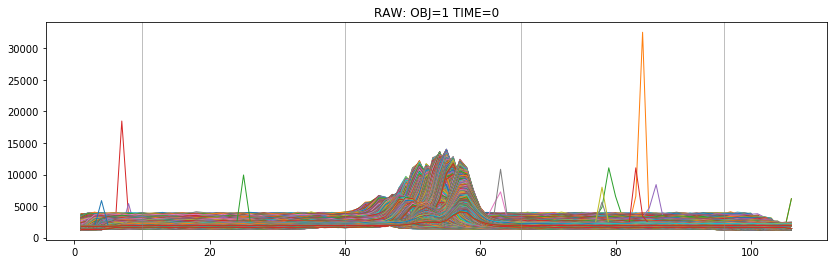

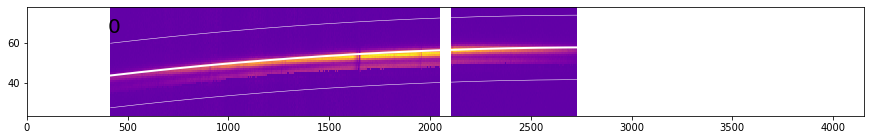

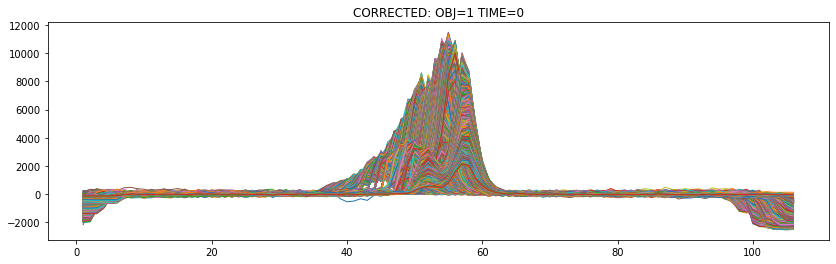

***  1  ***
***  2  ***
***  3  ***
***  4  ***
***  5  ***
***  6  ***
***  7  ***
***  8  ***
***  9  ***
       *** TIME:  10  ***


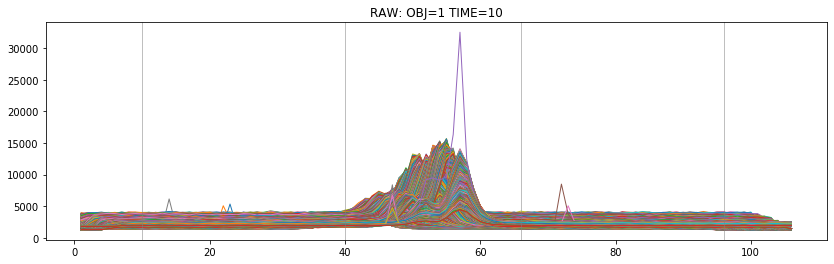

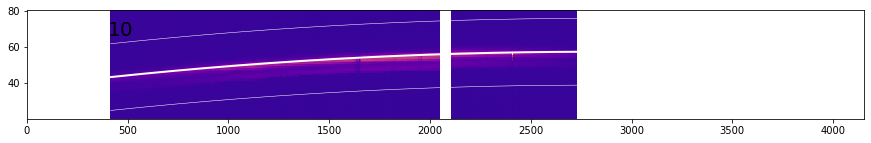

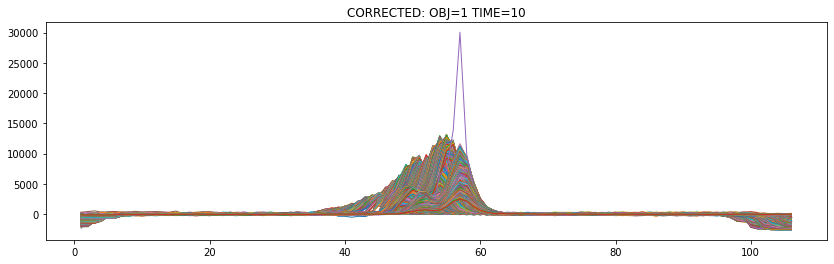

***  11  ***
***  12  ***
***  13  ***
***  14  ***
***  15  ***
***  16  ***
***  17  ***
***  18  ***
***  19  ***
       *** TIME:  20  ***


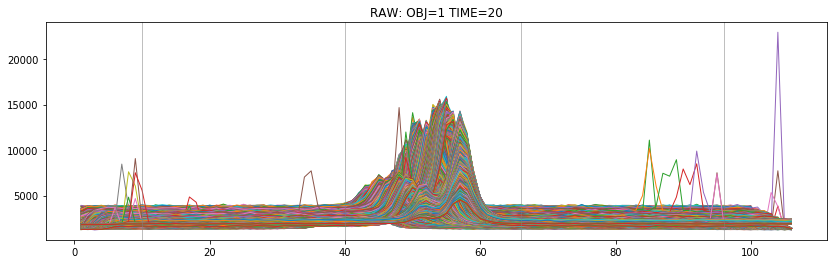

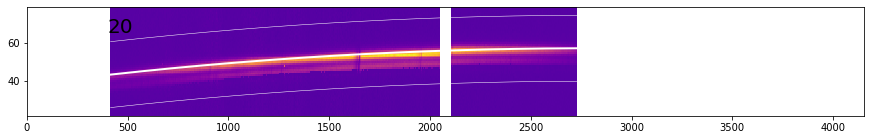

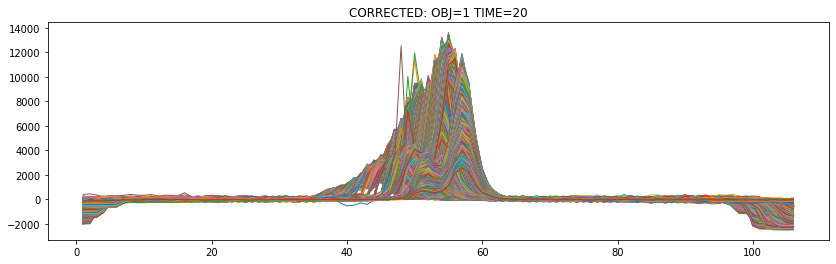

***  21  ***
***  22  ***
***  23  ***
***  24  ***
***  25  ***
***  26  ***
***  27  ***
***  28  ***
***  29  ***
       *** TIME:  30  ***


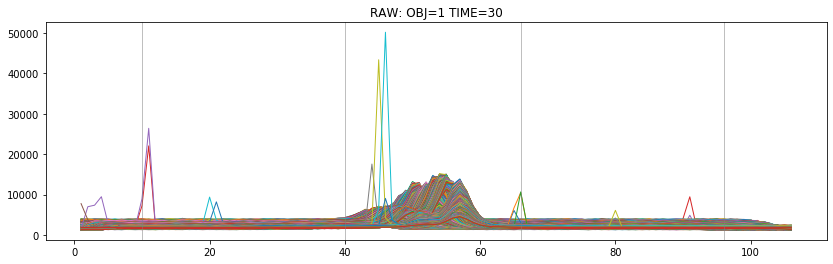

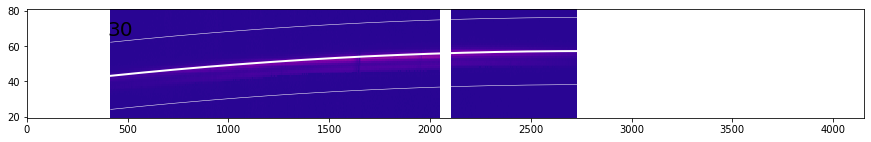

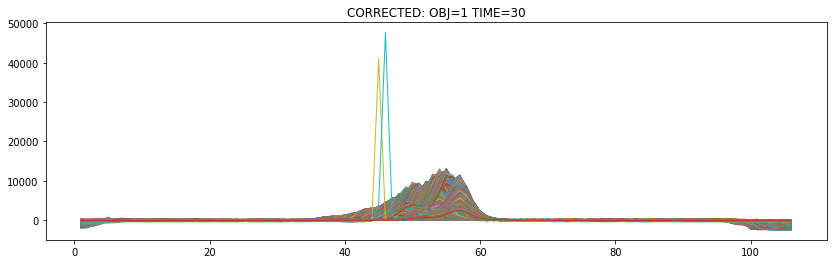

***  31  ***
***  32  ***
***  33  ***
***  34  ***
***  35  ***
***  36  ***
***  37  ***
***  38  ***
***  39  ***
       *** TIME:  40  ***


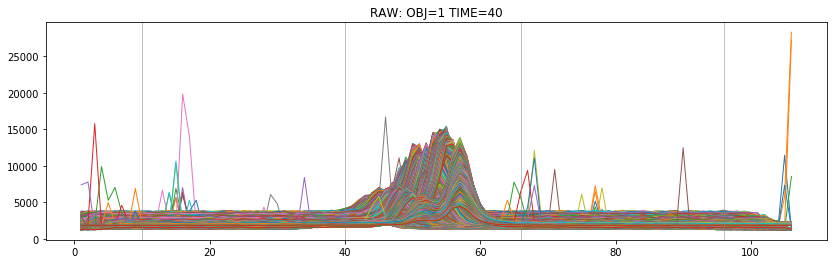

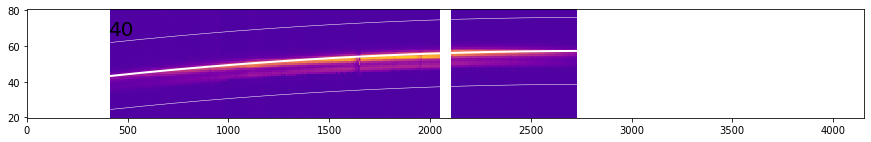

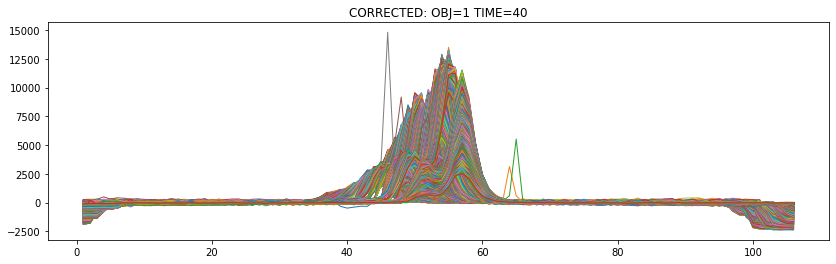

***  41  ***
***  42  ***
***  43  ***
***  44  ***
***  45  ***
***  46  ***
***  47  ***
***  48  ***
***  49  ***
       *** TIME:  50  ***


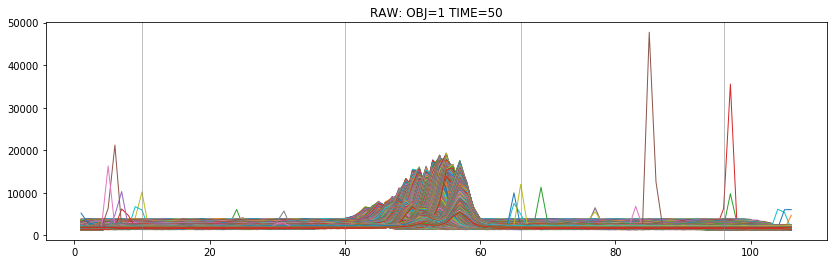

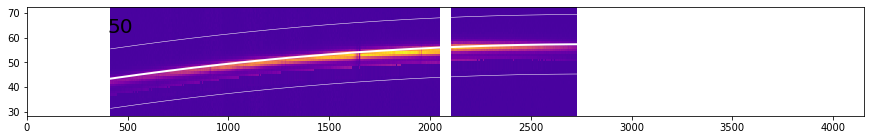

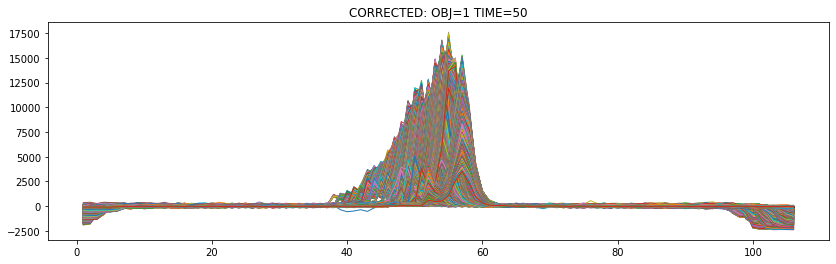

***  51  ***
***  52  ***
***  53  ***
***  54  ***
***  55  ***
***  56  ***
***  57  ***
***  58  ***
***  59  ***
       *** TIME:  60  ***


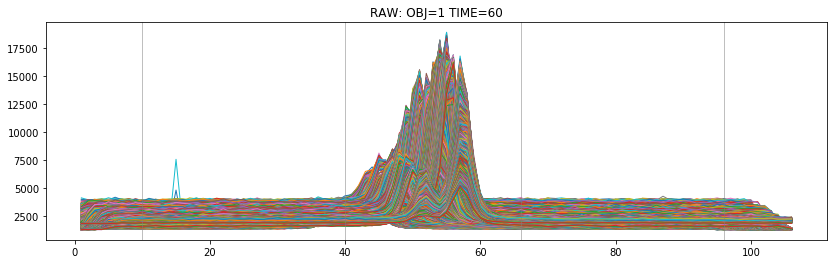

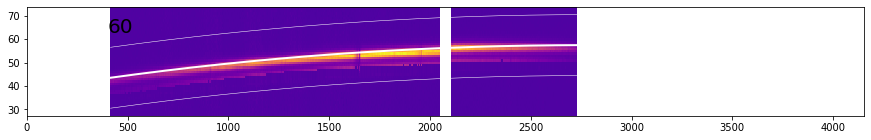

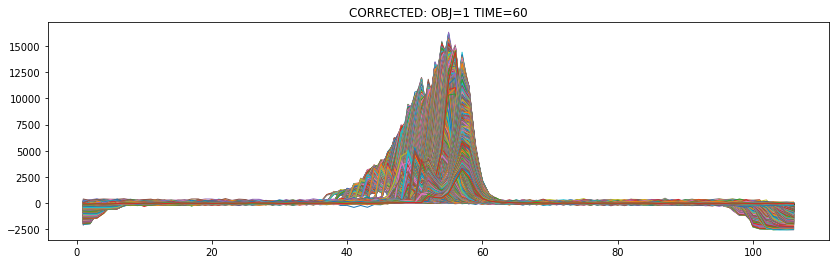

***  61  ***
***  62  ***
***  63  ***
***  64  ***
***  65  ***
***  66  ***
***  67  ***
***  68  ***
***  69  ***
       *** TIME:  70  ***


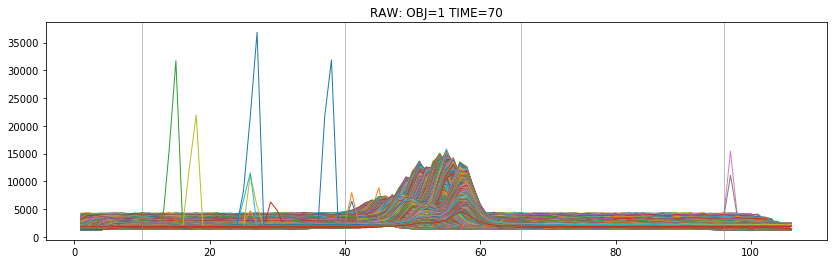

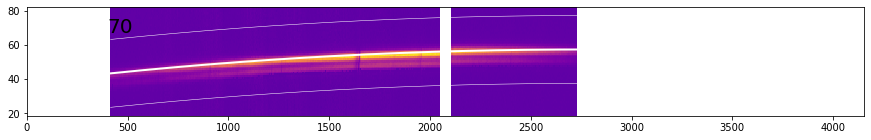

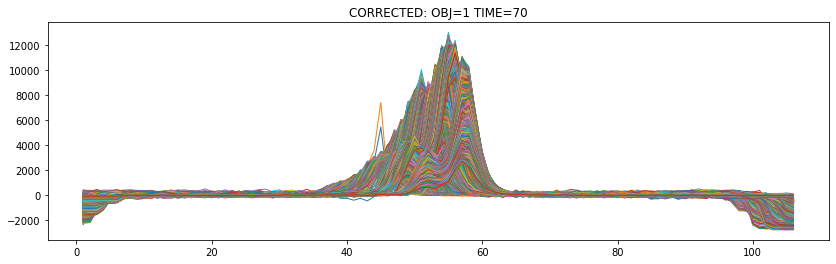

***  71  ***
***  72  ***
***  73  ***
***  74  ***
***  75  ***
***  76  ***
***  77  ***
***  78  ***
***  79  ***
       *** TIME:  80  ***


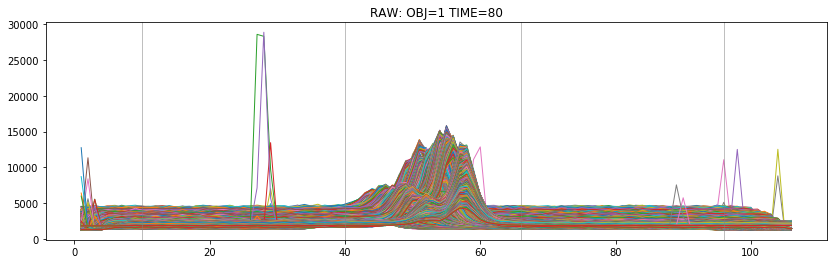

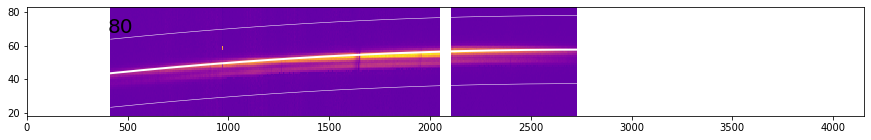

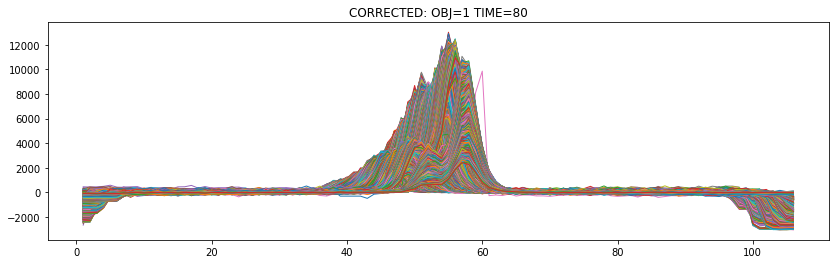

***  81  ***
***  82  ***
***  83  ***
***  84  ***
***  85  ***
***  86  ***
***  87  ***
***  88  ***
***  89  ***
       *** TIME:  90  ***


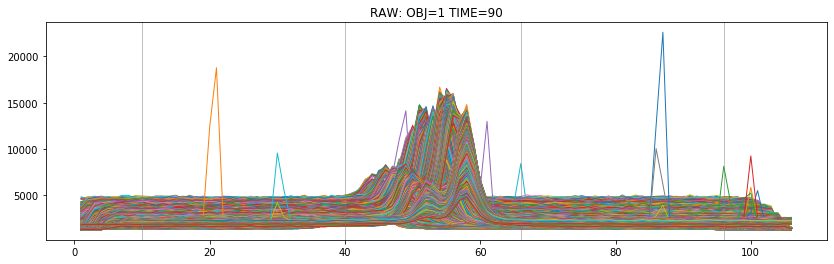

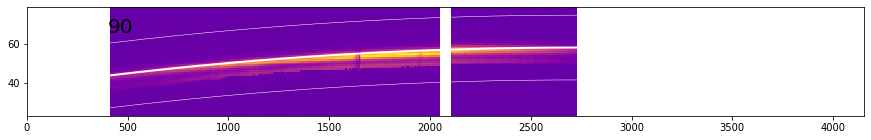

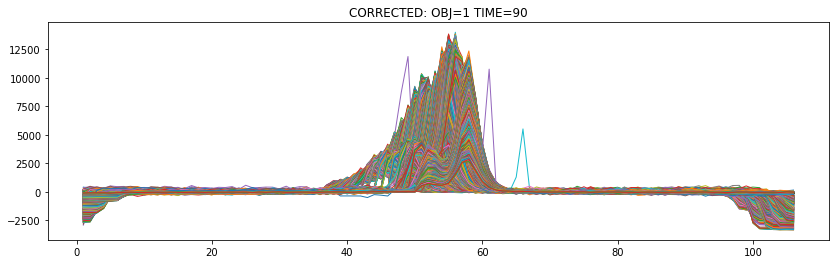

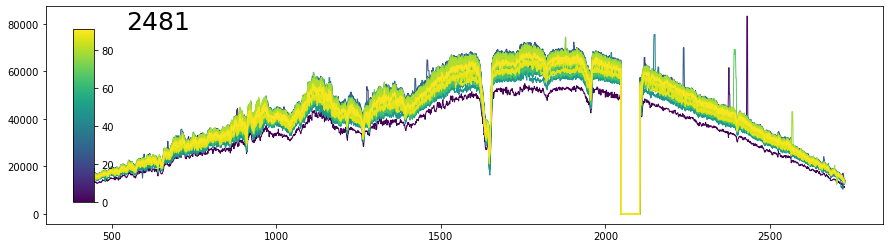

0:18:00.405426
-----------------
  OBJECT #  2
-----------------
 ----> loading data...
      (done)
 ----> loading masks...
      (done)
2 2247 102 0
       *** TIME:  0  ***


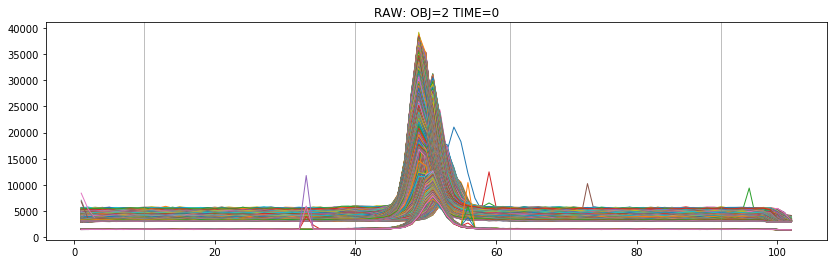

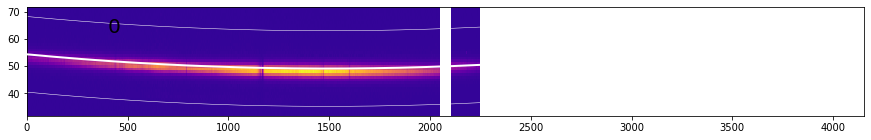

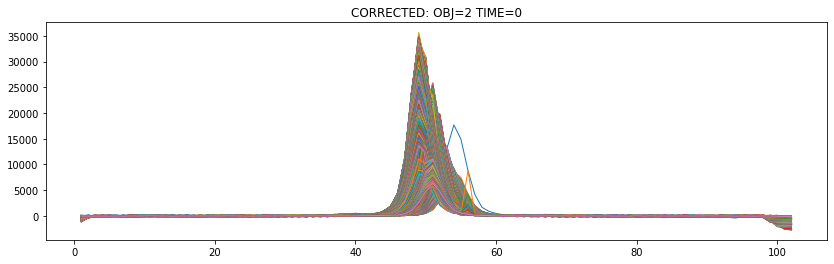

***  1  ***
***  2  ***
***  3  ***
***  4  ***
***  5  ***
***  6  ***
***  7  ***
***  8  ***
***  9  ***
       *** TIME:  10  ***


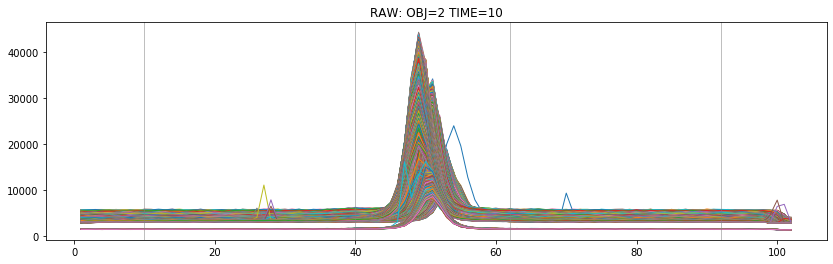

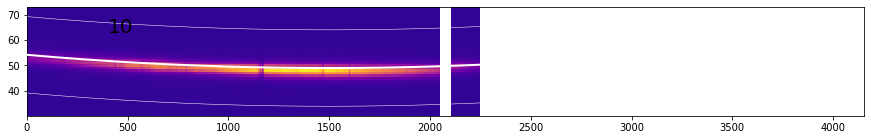

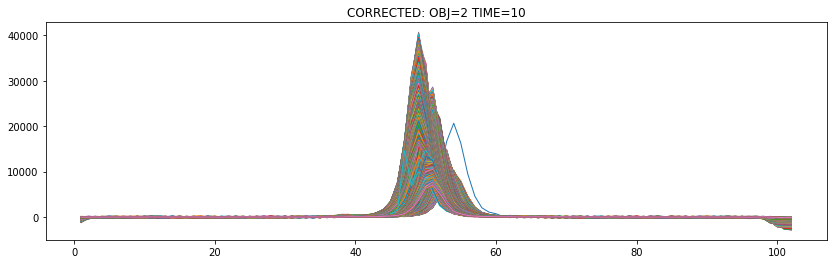

***  11  ***
***  12  ***
***  13  ***
***  14  ***
***  15  ***
***  16  ***
***  17  ***
***  18  ***
***  19  ***
       *** TIME:  20  ***


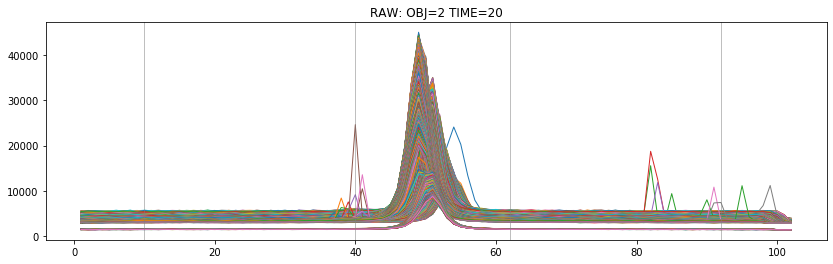

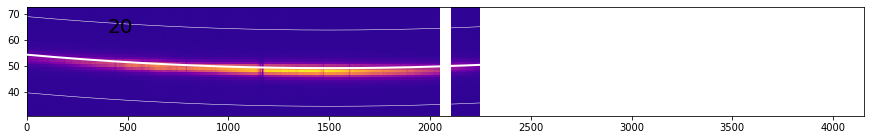

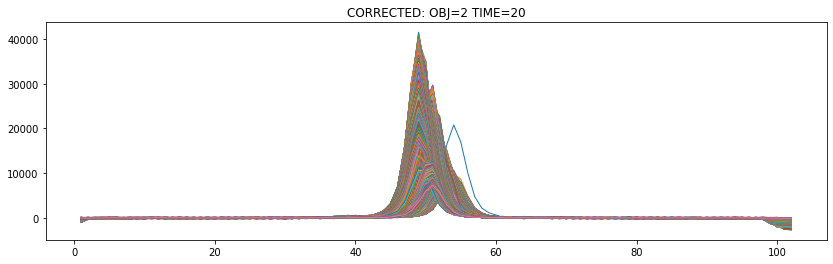

***  21  ***
***  22  ***
***  23  ***
***  24  ***
***  25  ***
***  26  ***
***  27  ***
***  28  ***
***  29  ***
       *** TIME:  30  ***


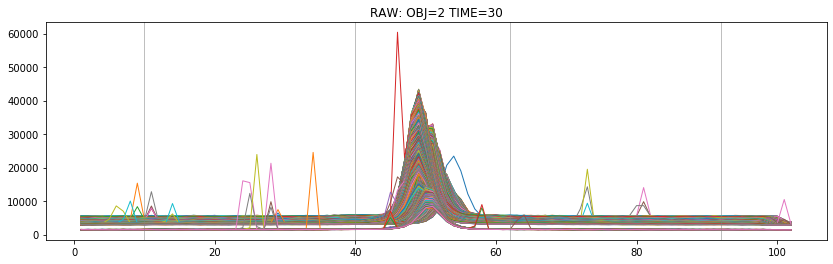

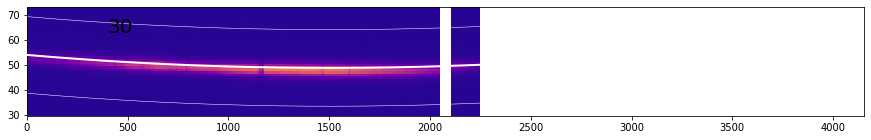

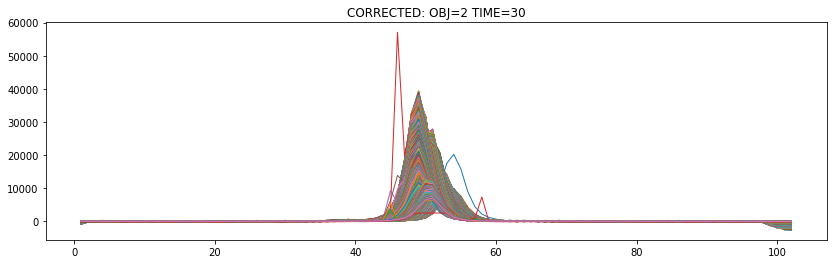

***  31  ***
***  32  ***
***  33  ***
***  34  ***
***  35  ***
***  36  ***
***  37  ***
***  38  ***
***  39  ***
       *** TIME:  40  ***


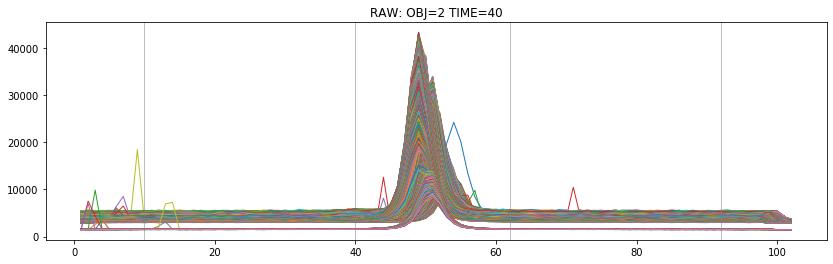

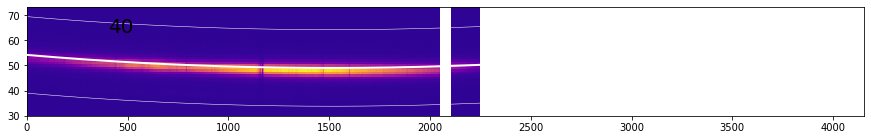

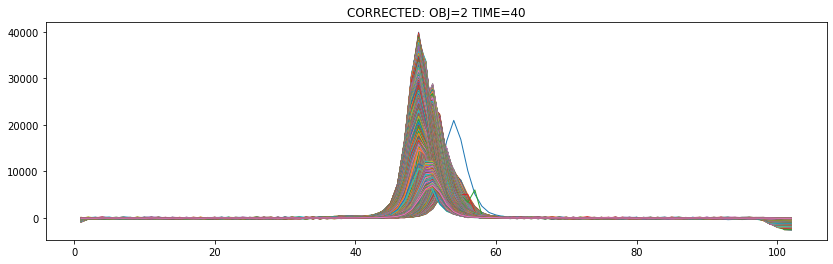

***  41  ***
***  42  ***
***  43  ***
***  44  ***
***  45  ***
***  46  ***
***  47  ***
***  48  ***
***  49  ***
       *** TIME:  50  ***


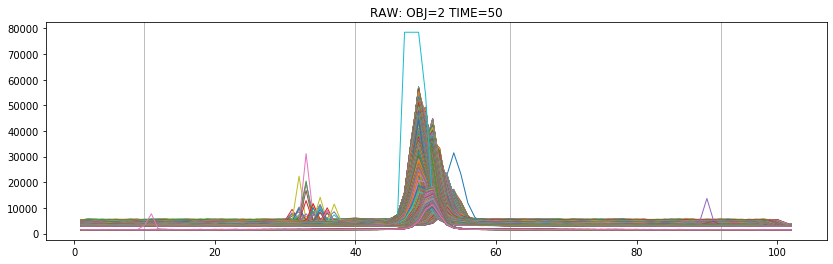

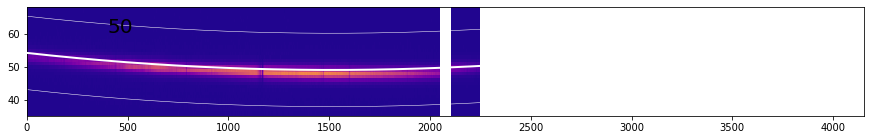

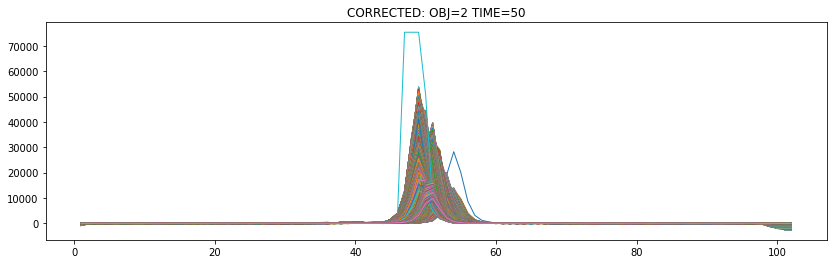

***  51  ***
***  52  ***
***  53  ***
***  54  ***
***  55  ***
***  56  ***
***  57  ***
***  58  ***
***  59  ***
       *** TIME:  60  ***


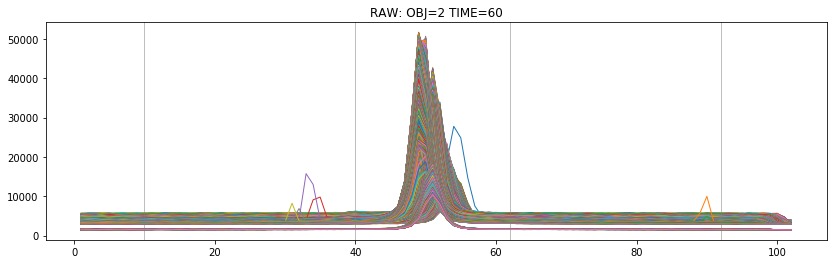

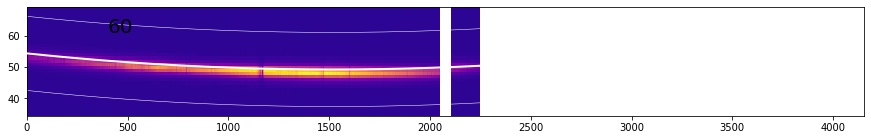

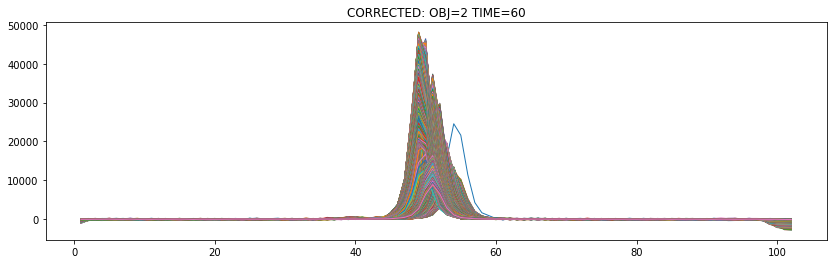

***  61  ***
***  62  ***
***  63  ***
***  64  ***
***  65  ***
***  66  ***
***  67  ***
***  68  ***
***  69  ***
       *** TIME:  70  ***


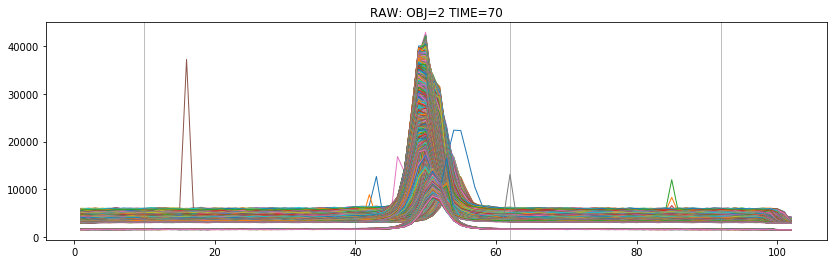

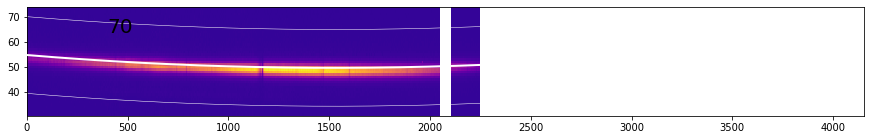

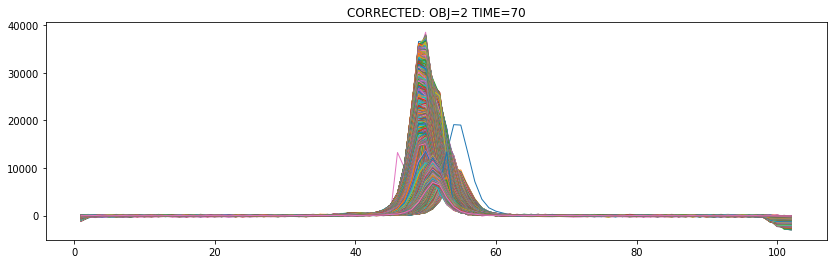

***  71  ***
***  72  ***
***  73  ***
***  74  ***
***  75  ***
***  76  ***
***  77  ***
***  78  ***
***  79  ***
       *** TIME:  80  ***


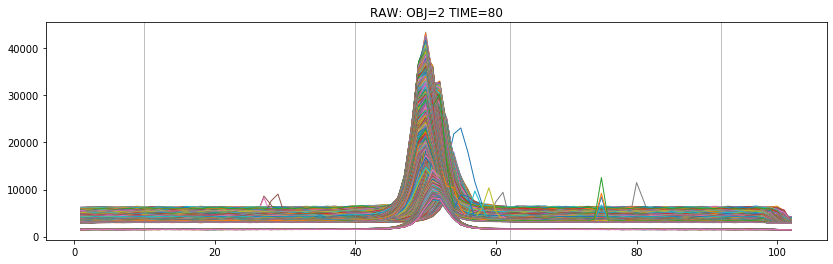

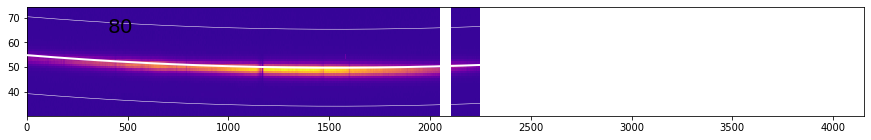

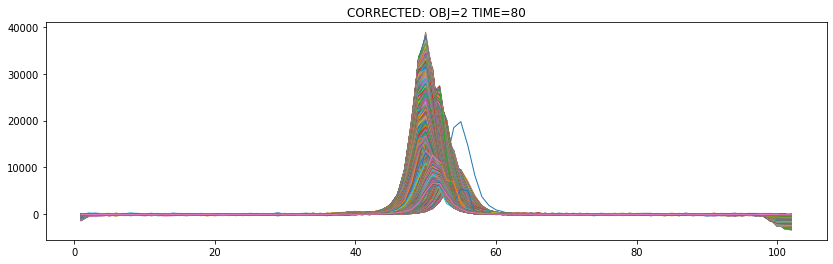

***  81  ***
***  82  ***
***  83  ***
***  84  ***
***  85  ***
***  86  ***
***  87  ***
***  88  ***
***  89  ***
       *** TIME:  90  ***


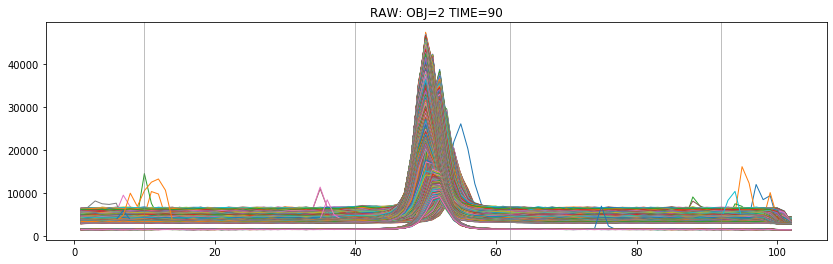

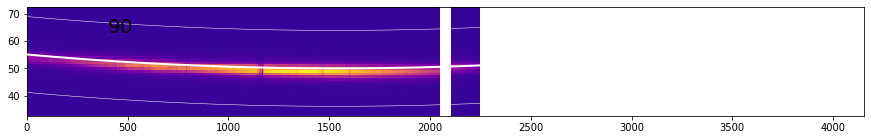

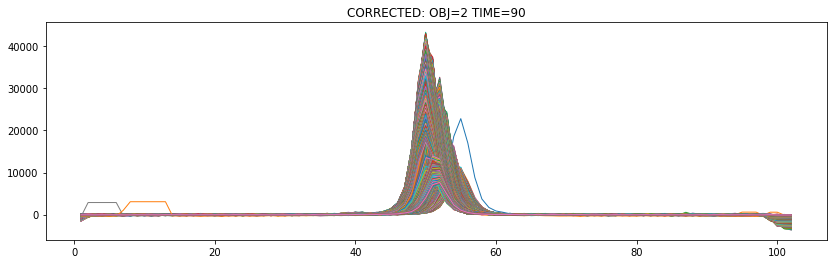

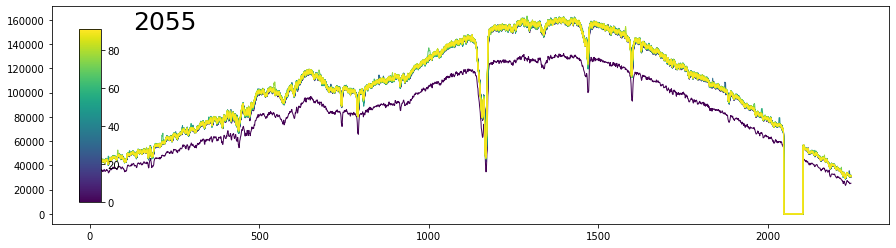

0:12:05.654785
-----------------
  OBJECT #  3
-----------------
 ----> loading data...
      (done)
 ----> loading masks...
      (done)
3 2354 101 3
       *** TIME:  0  ***


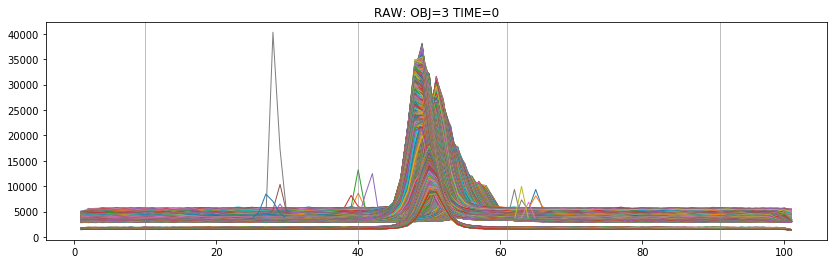

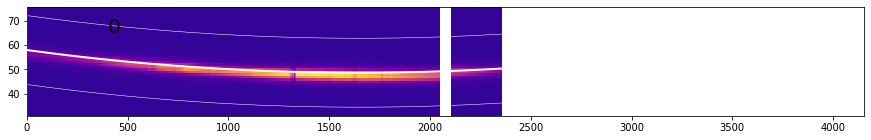

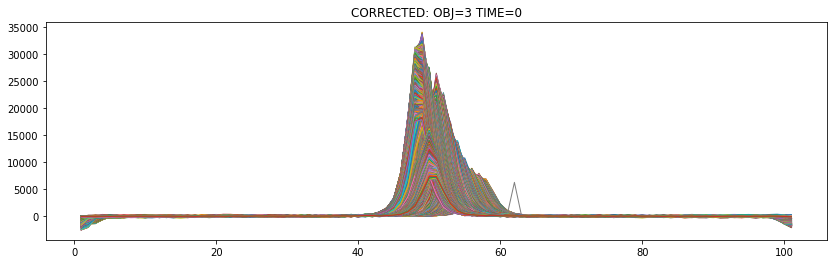

***  1  ***
***  2  ***
***  3  ***
***  4  ***
***  5  ***
***  6  ***
***  7  ***
***  8  ***
***  9  ***
       *** TIME:  10  ***


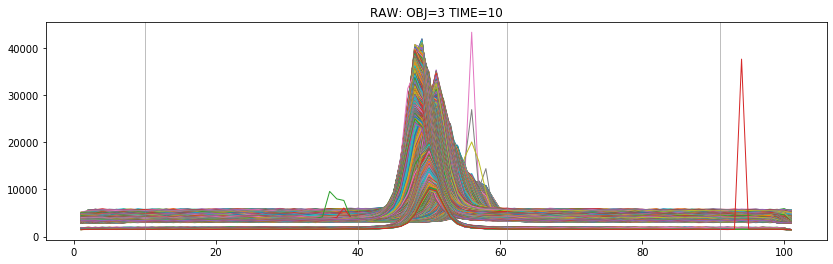

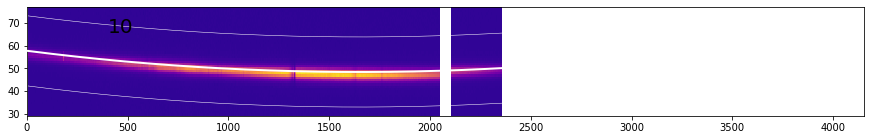

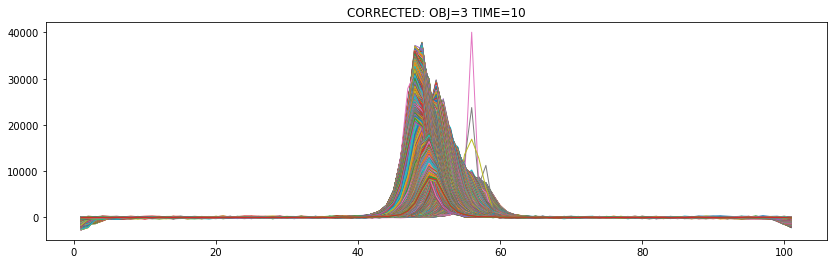

***  11  ***
***  12  ***
***  13  ***
***  14  ***
***  15  ***
***  16  ***
***  17  ***
***  18  ***
***  19  ***
       *** TIME:  20  ***


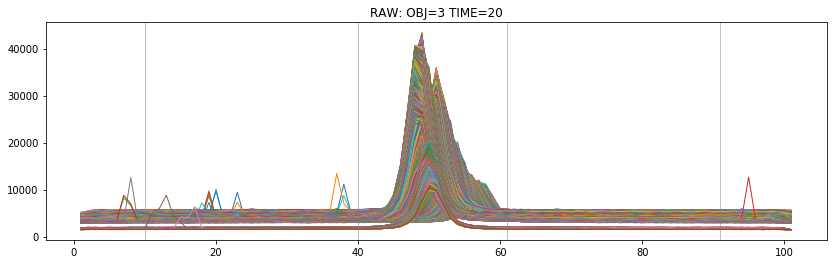

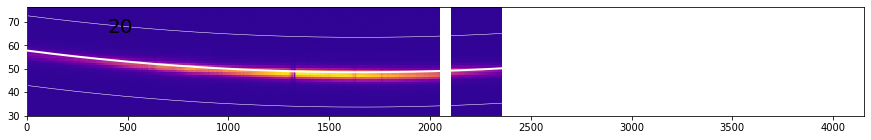

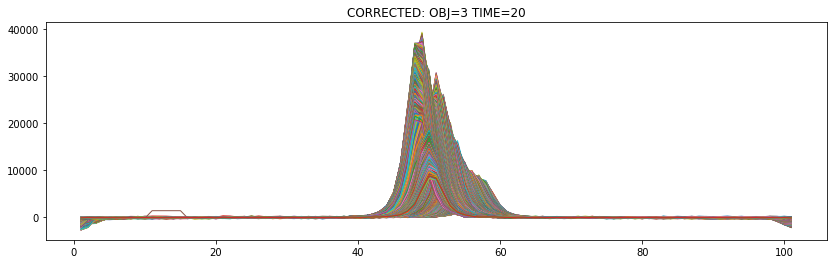

***  21  ***
***  22  ***
***  23  ***
***  24  ***
***  25  ***
***  26  ***
***  27  ***
***  28  ***
***  29  ***
       *** TIME:  30  ***


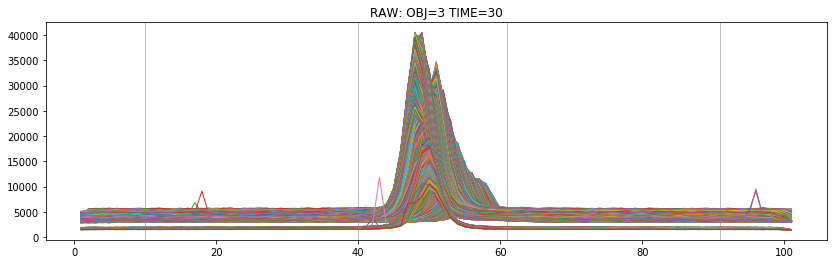

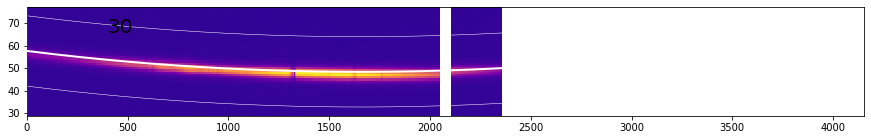

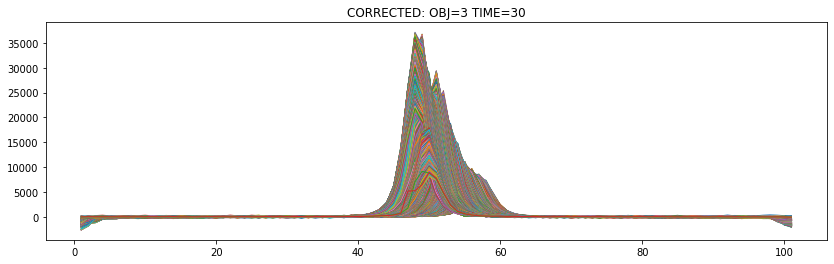

***  31  ***
***  32  ***
***  33  ***
***  34  ***
***  35  ***
***  36  ***
***  37  ***
***  38  ***
***  39  ***
       *** TIME:  40  ***


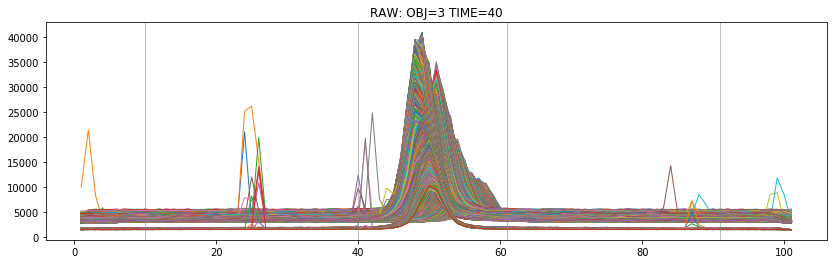

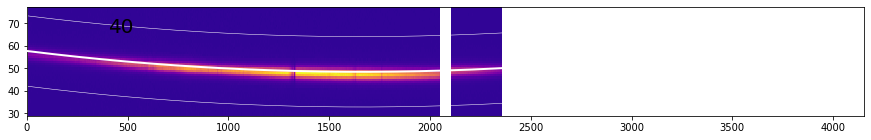

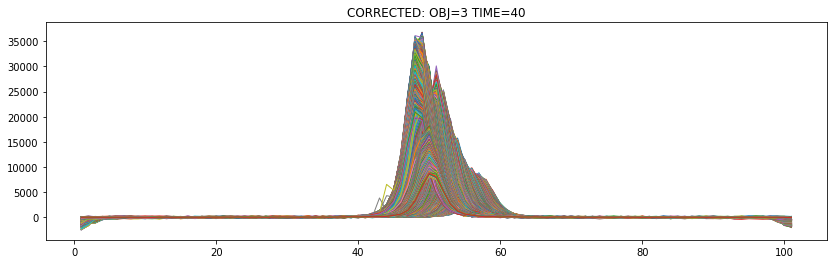

***  41  ***
***  42  ***
***  43  ***
***  44  ***
***  45  ***
***  46  ***
***  47  ***
***  48  ***
***  49  ***
       *** TIME:  50  ***


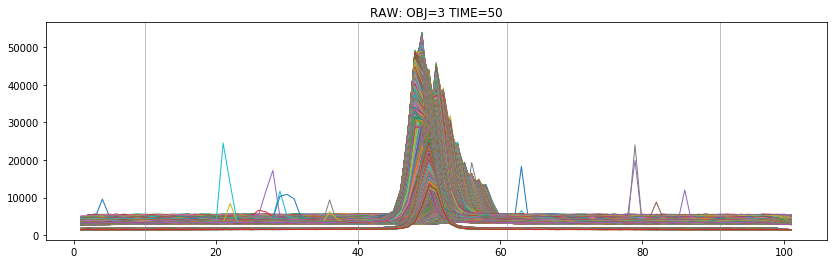

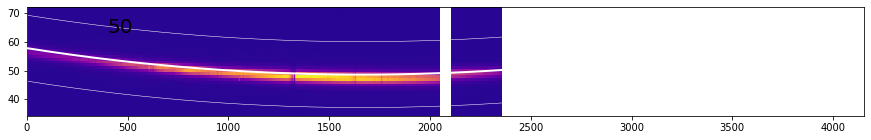

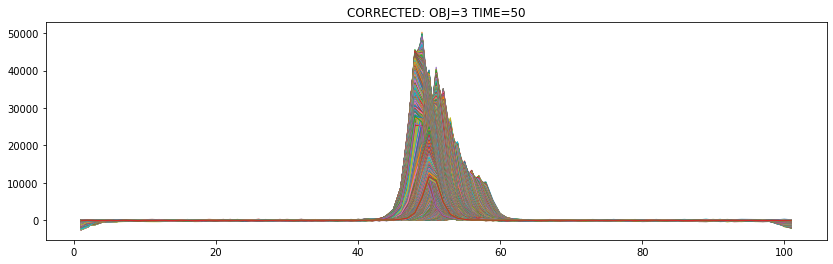

***  51  ***
***  52  ***
***  53  ***
***  54  ***
***  55  ***
***  56  ***
***  57  ***
***  58  ***
***  59  ***
       *** TIME:  60  ***


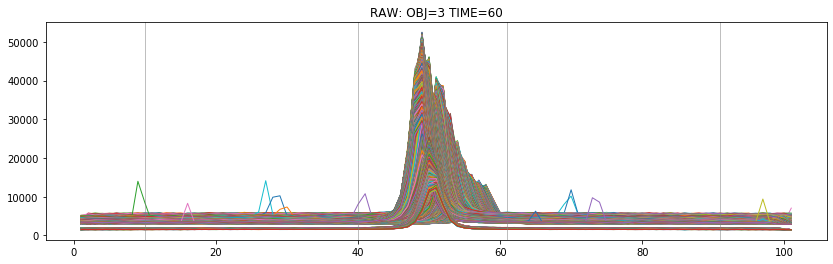

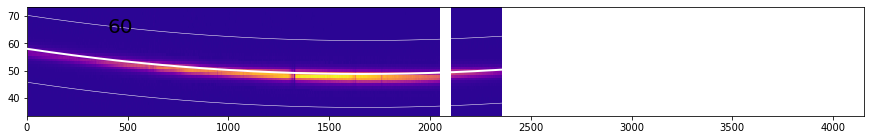

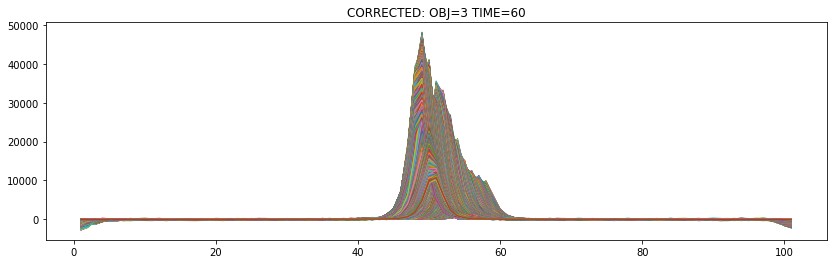

***  61  ***
***  62  ***
***  63  ***
***  64  ***
***  65  ***
***  66  ***
***  67  ***
***  68  ***
***  69  ***
       *** TIME:  70  ***


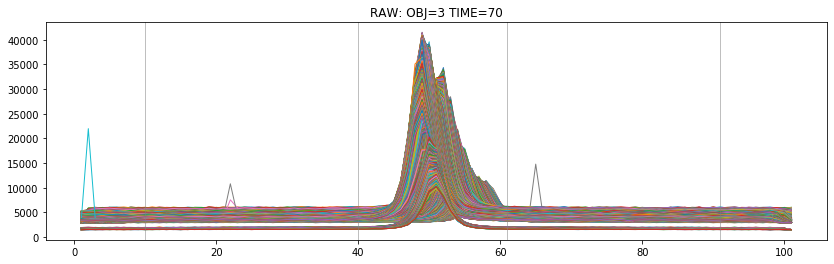

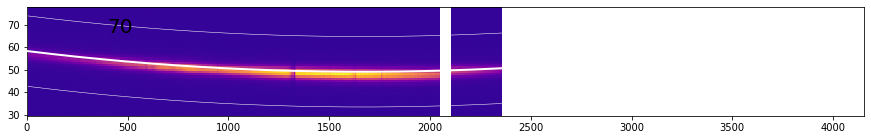

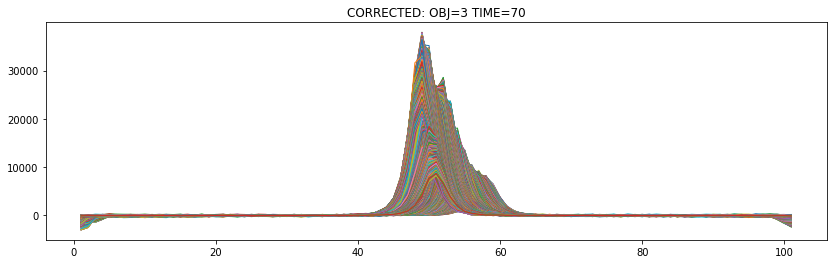

***  71  ***
***  72  ***
***  73  ***
***  74  ***
***  75  ***
***  76  ***
***  77  ***
***  78  ***
***  79  ***
       *** TIME:  80  ***


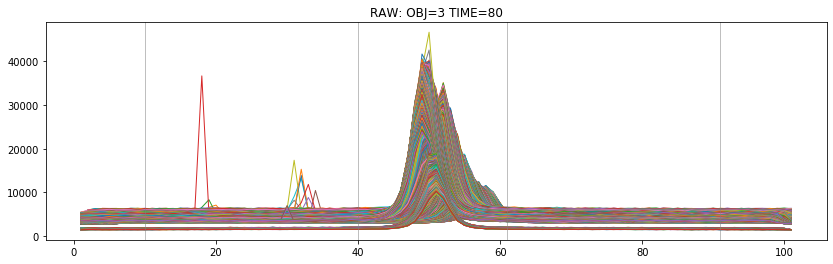

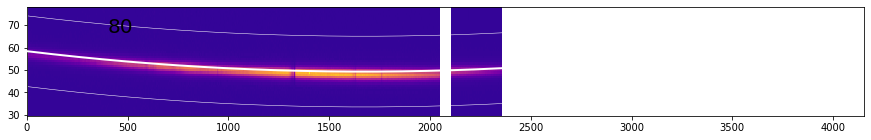

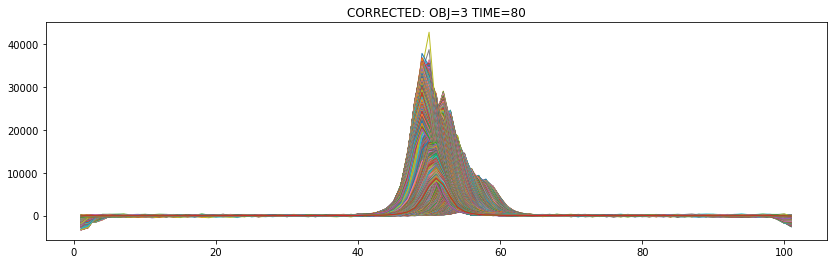

***  81  ***
***  82  ***
***  83  ***
***  84  ***
***  85  ***
***  86  ***
***  87  ***
***  88  ***
***  89  ***
       *** TIME:  90  ***


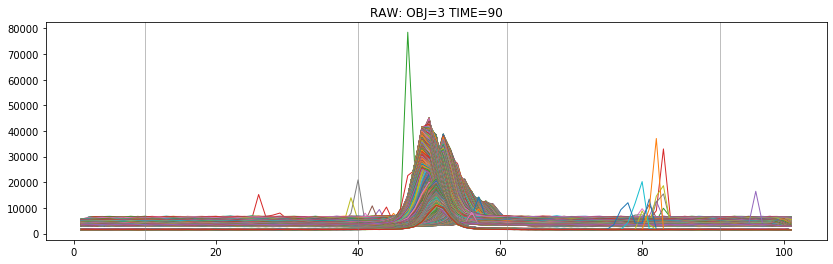

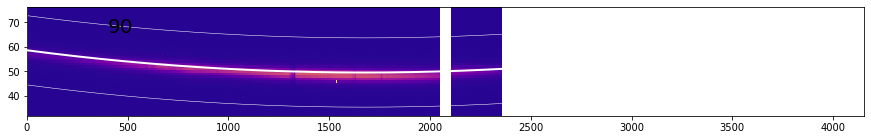

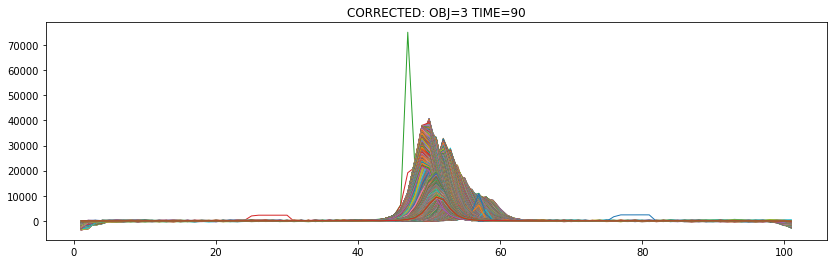

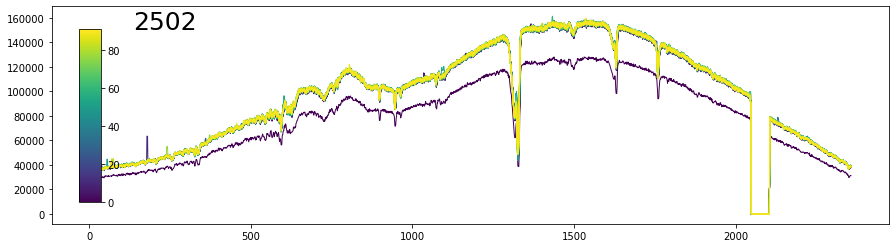

0:12:31.897351
-----------------
  OBJECT #  4
-----------------
 ----> loading data...
      (done)
 ----> loading masks...
      (done)
4 2473 103 195
       *** TIME:  0  ***


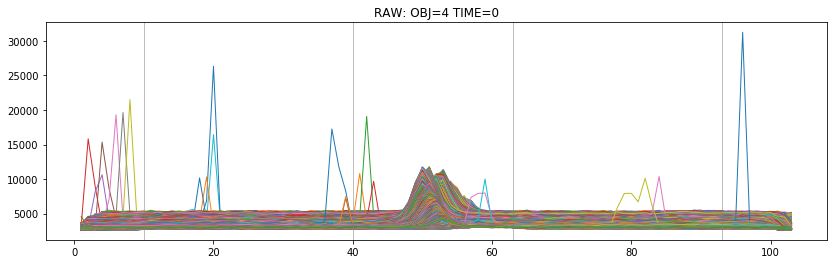

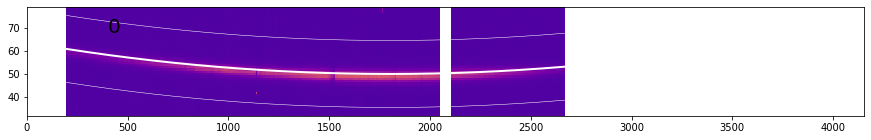

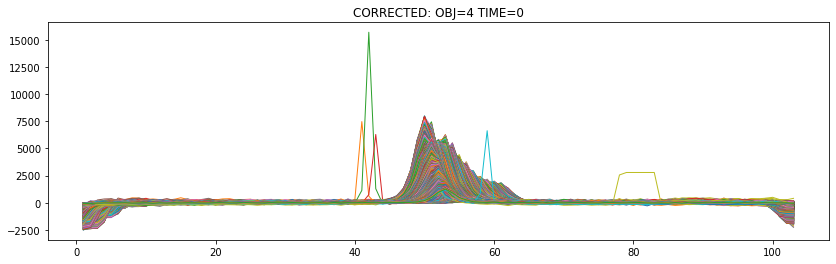

***  1  ***
***  2  ***
***  3  ***
***  4  ***
***  5  ***
***  6  ***
***  7  ***
***  8  ***
***  9  ***
       *** TIME:  10  ***


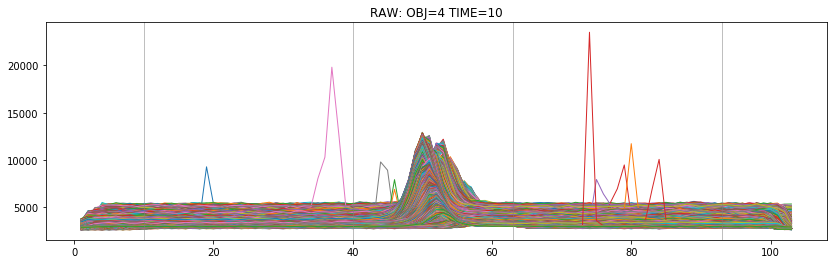

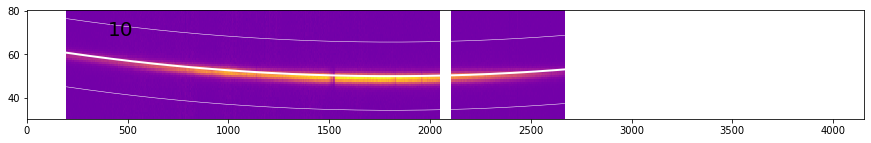

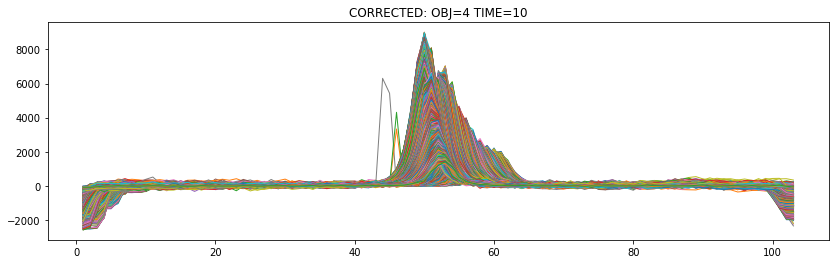

***  11  ***
***  12  ***
***  13  ***
***  14  ***
***  15  ***
***  16  ***
***  17  ***
***  18  ***
***  19  ***
       *** TIME:  20  ***


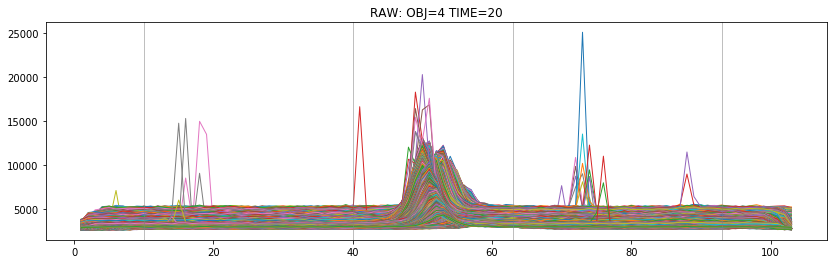

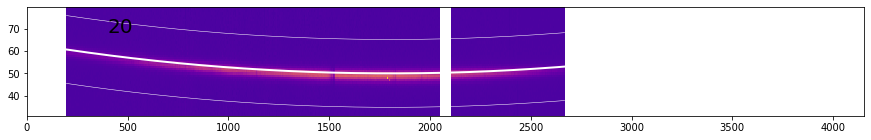

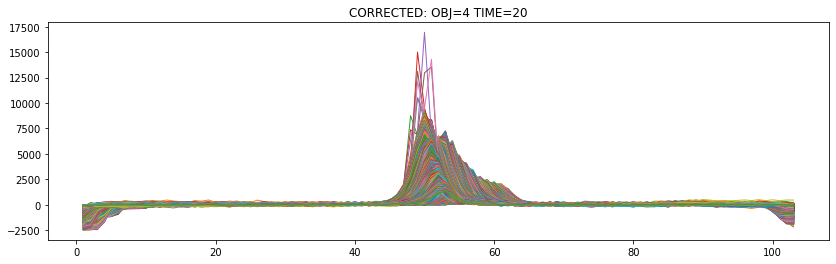

***  21  ***
***  22  ***
***  23  ***
***  24  ***
***  25  ***
***  26  ***
***  27  ***
***  28  ***
***  29  ***
       *** TIME:  30  ***


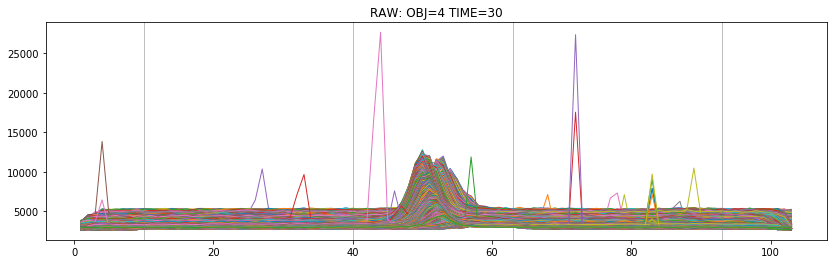

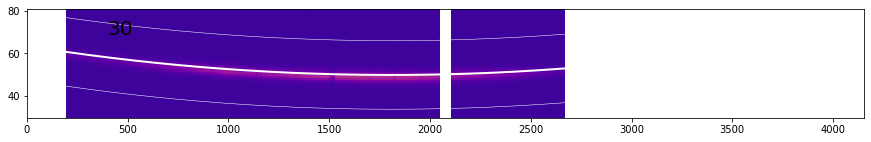

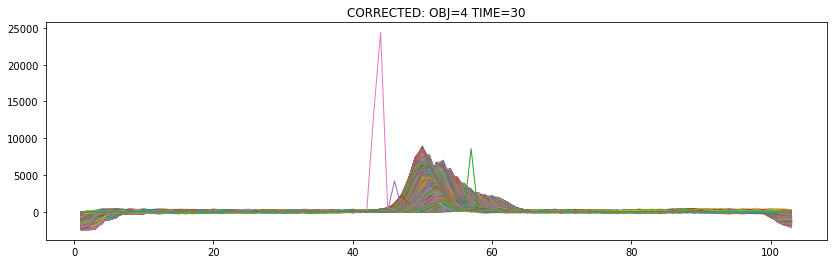

***  31  ***
***  32  ***
***  33  ***
***  34  ***
***  35  ***
***  36  ***
***  37  ***
***  38  ***
***  39  ***
       *** TIME:  40  ***


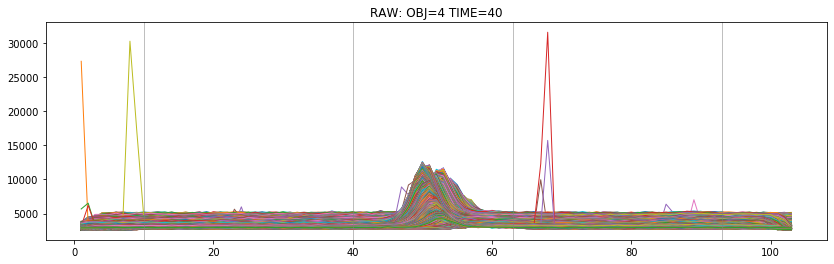

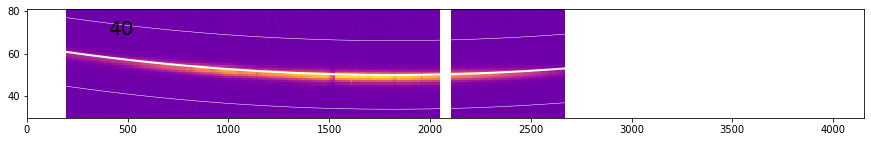

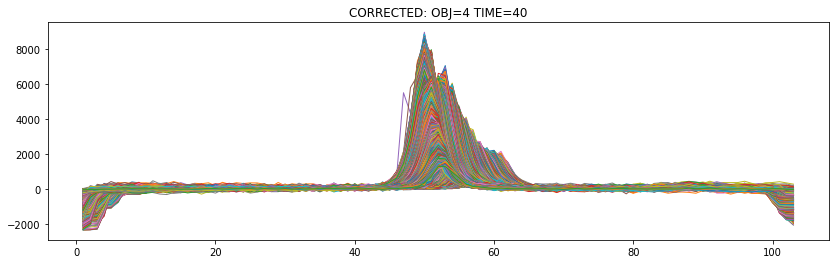

***  41  ***
***  42  ***
***  43  ***
***  44  ***
***  45  ***
***  46  ***
***  47  ***
***  48  ***
***  49  ***
       *** TIME:  50  ***


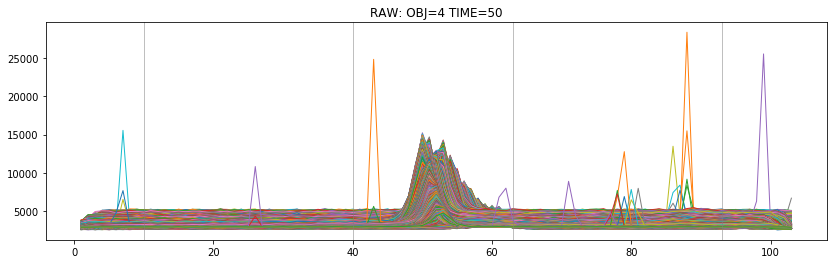

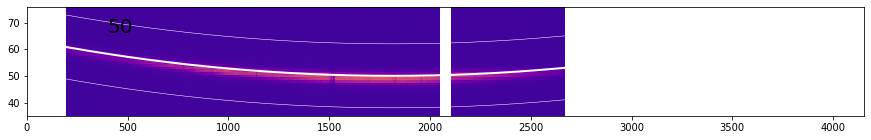

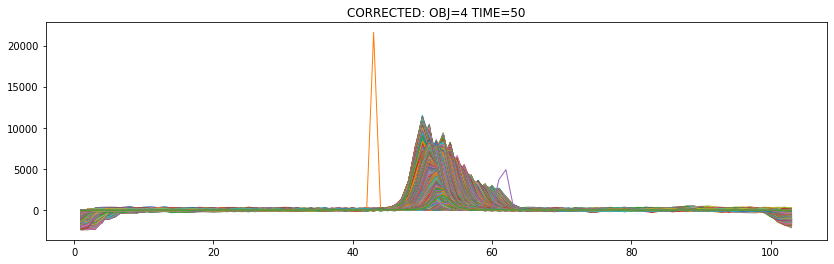

***  51  ***
***  52  ***
***  53  ***
***  54  ***
***  55  ***
***  56  ***
***  57  ***
***  58  ***
***  59  ***
       *** TIME:  60  ***


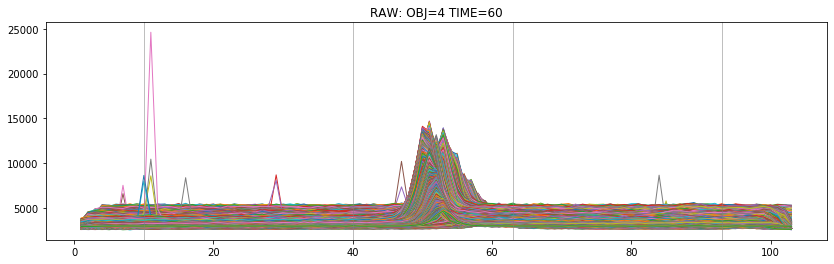

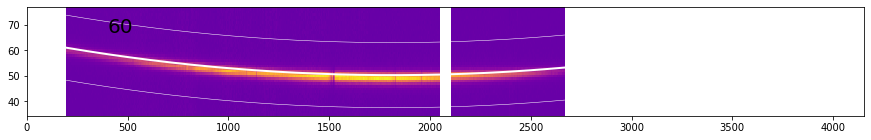

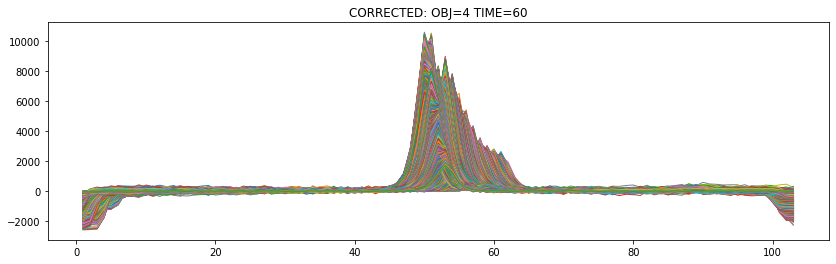

***  61  ***
***  62  ***
***  63  ***
***  64  ***
***  65  ***
***  66  ***
***  67  ***
***  68  ***
***  69  ***
       *** TIME:  70  ***


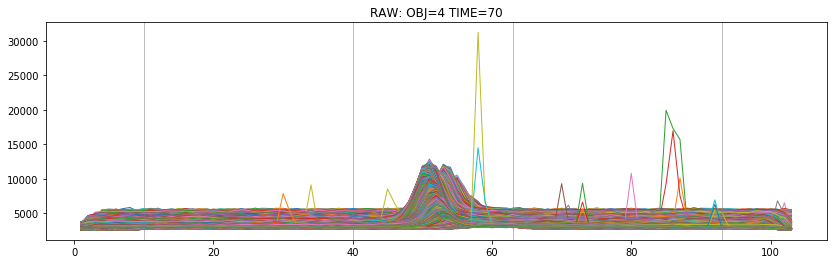

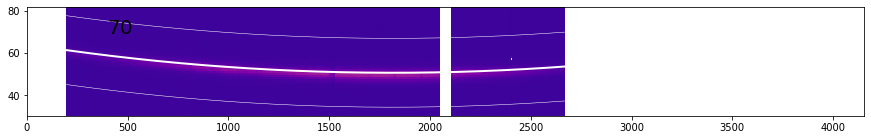

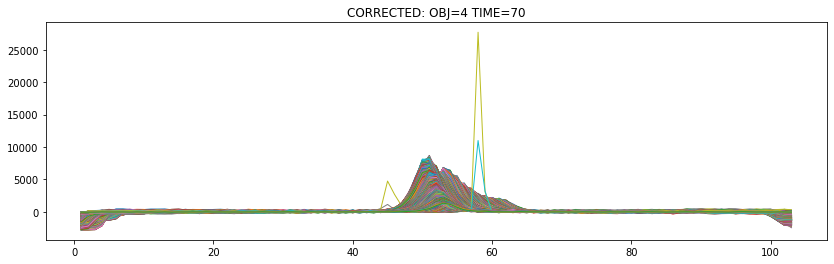

***  71  ***
***  72  ***
***  73  ***
***  74  ***
***  75  ***
***  76  ***
***  77  ***
***  78  ***
***  79  ***
       *** TIME:  80  ***


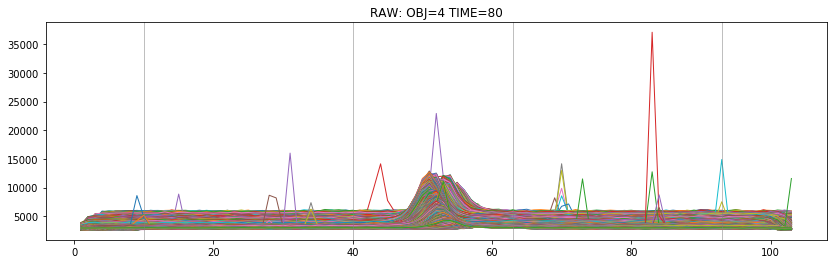

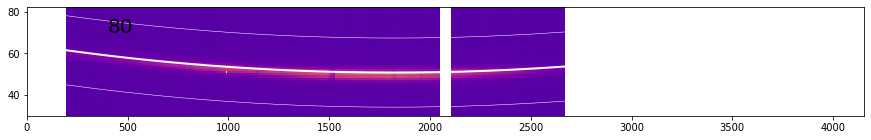

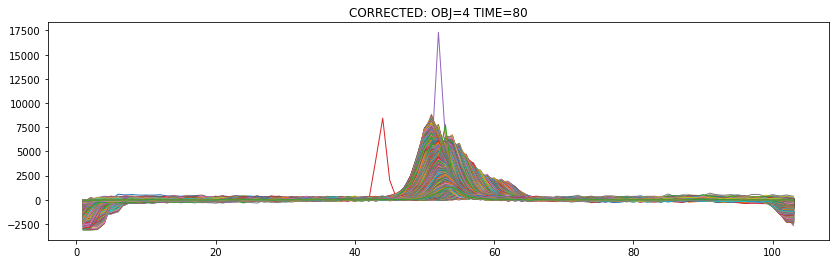

***  81  ***
***  82  ***
***  83  ***
***  84  ***
***  85  ***
***  86  ***
***  87  ***
***  88  ***
***  89  ***
       *** TIME:  90  ***


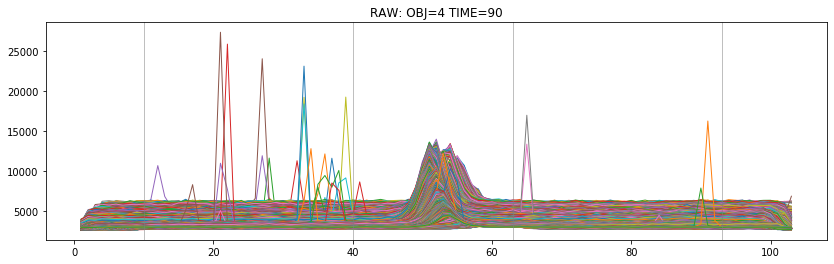

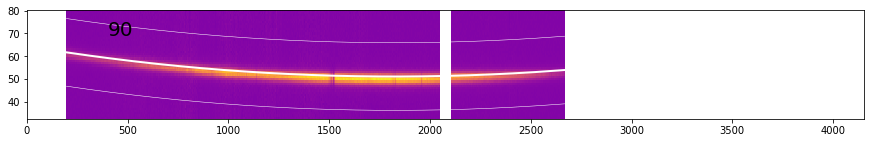

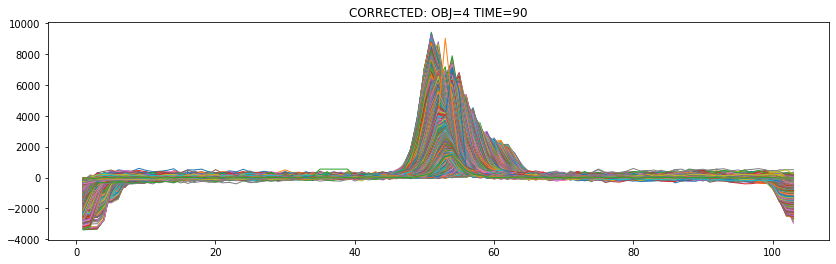

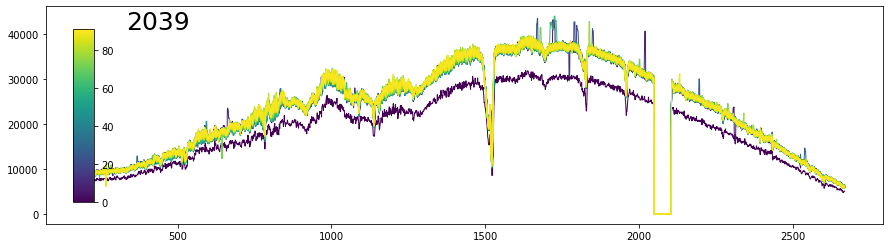

0:12:58.716720
-----------------
  OBJECT #  5
-----------------
 ----> loading data...
      (done)
 ----> loading masks...
      (done)
5 2438 106 0
       *** TIME:  0  ***


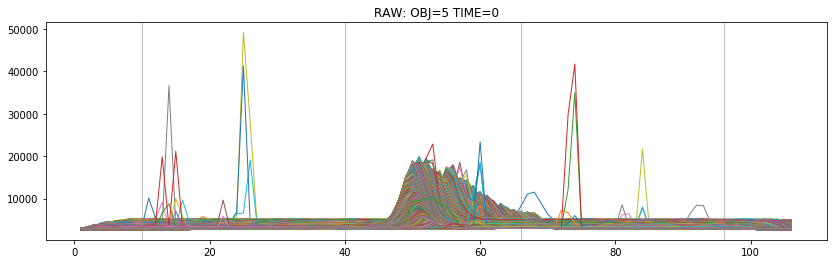

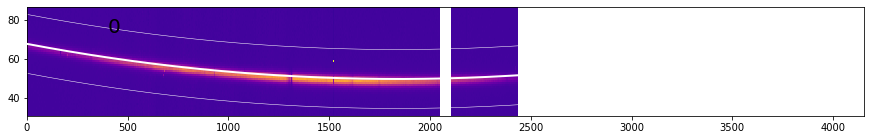

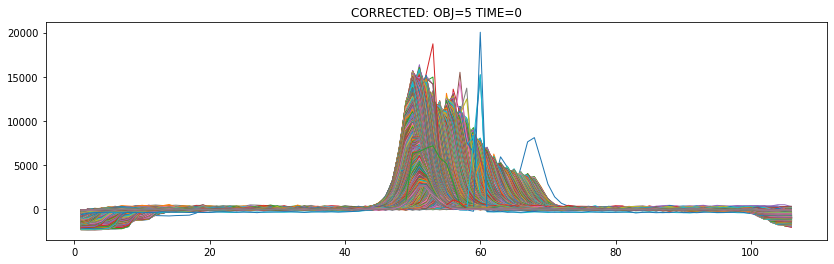

***  1  ***
***  2  ***
***  3  ***
***  4  ***
***  5  ***
***  6  ***
***  7  ***
***  8  ***
***  9  ***
       *** TIME:  10  ***


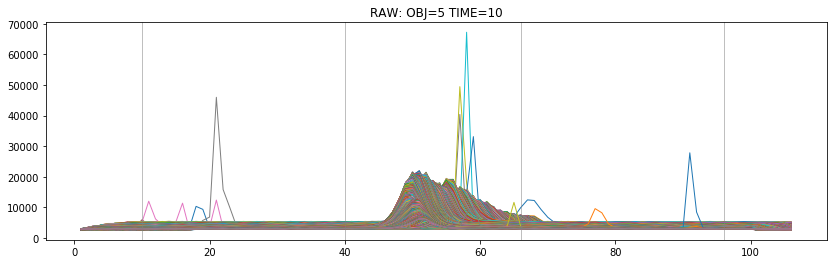

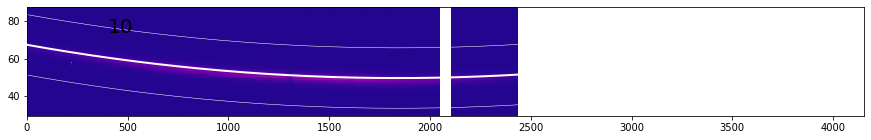

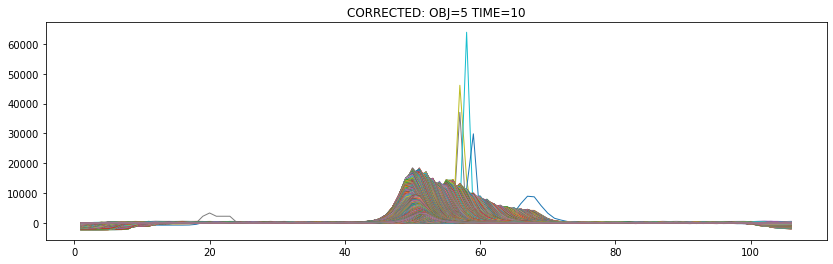

***  11  ***
***  12  ***
***  13  ***
***  14  ***
***  15  ***
***  16  ***
***  17  ***
***  18  ***
***  19  ***
       *** TIME:  20  ***


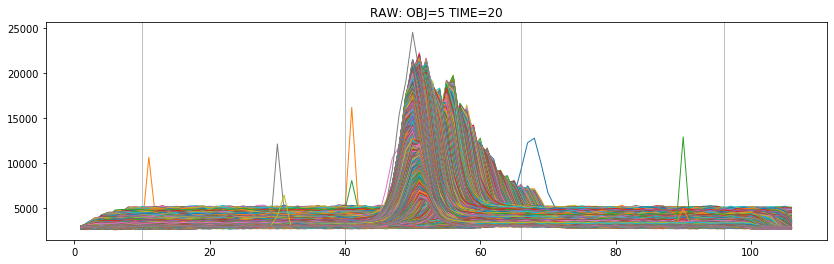

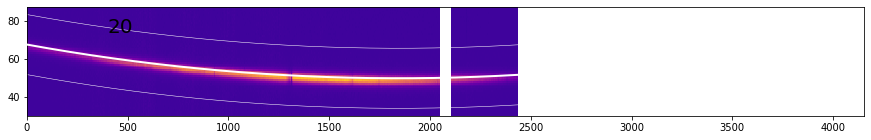

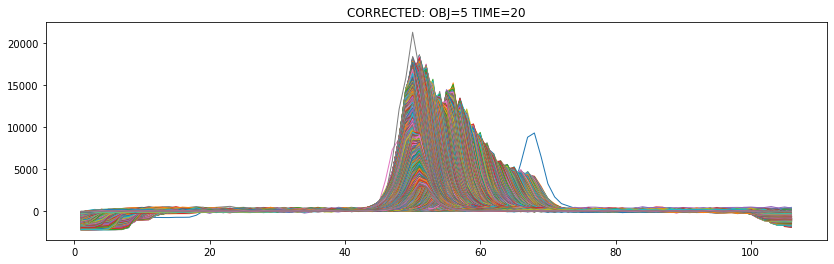

***  21  ***
***  22  ***
***  23  ***
***  24  ***
***  25  ***
***  26  ***
***  27  ***
***  28  ***
***  29  ***
       *** TIME:  30  ***


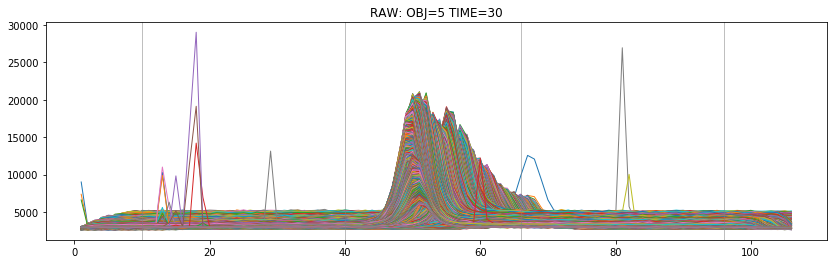

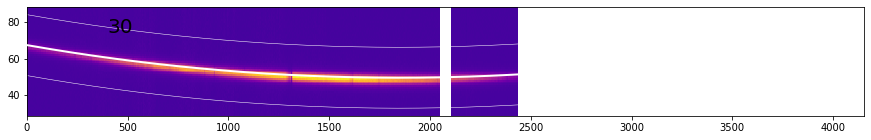

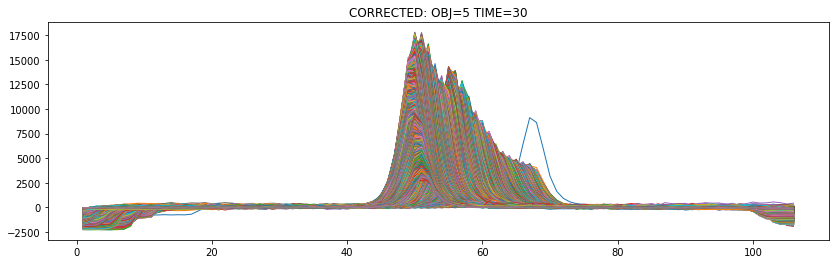

***  31  ***
***  32  ***
***  33  ***
***  34  ***
***  35  ***
***  36  ***
***  37  ***
***  38  ***
***  39  ***
       *** TIME:  40  ***


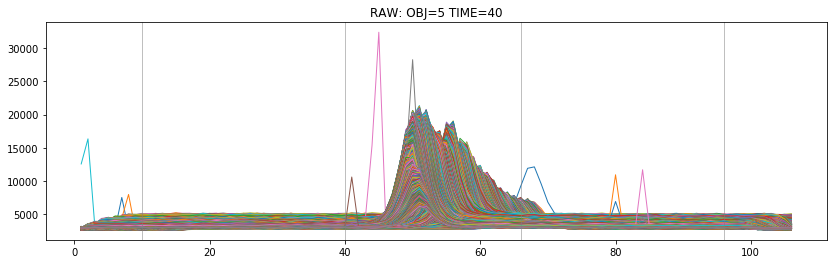

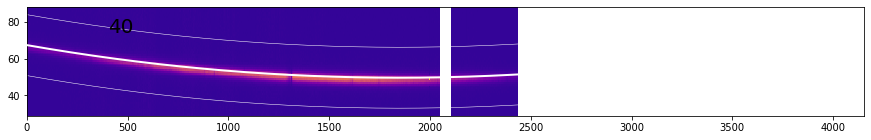

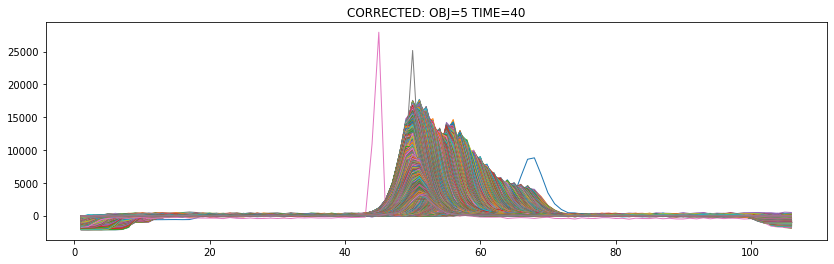

***  41  ***
***  42  ***
***  43  ***
***  44  ***
***  45  ***
***  46  ***
***  47  ***
***  48  ***
***  49  ***
       *** TIME:  50  ***


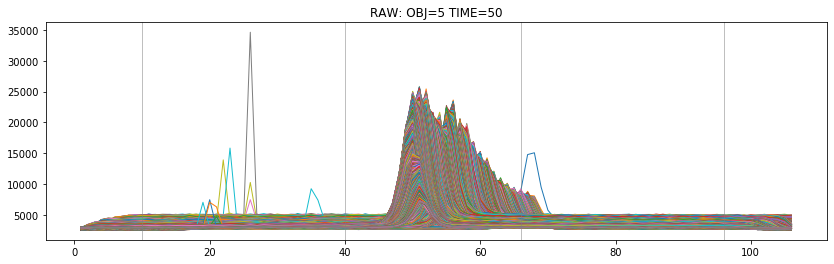

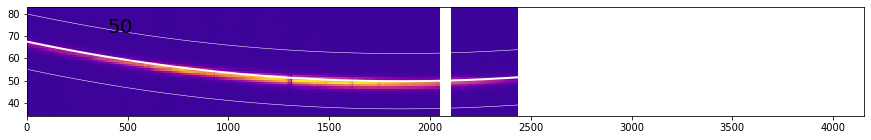

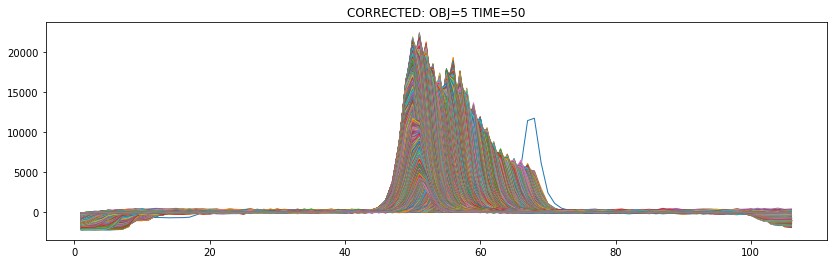

***  51  ***
***  52  ***
***  53  ***
***  54  ***
***  55  ***
***  56  ***
***  57  ***
***  58  ***
***  59  ***
       *** TIME:  60  ***


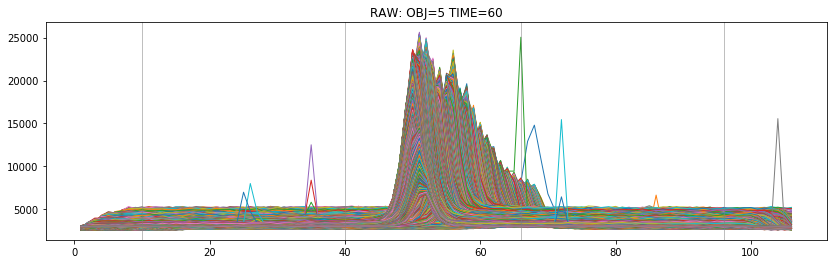

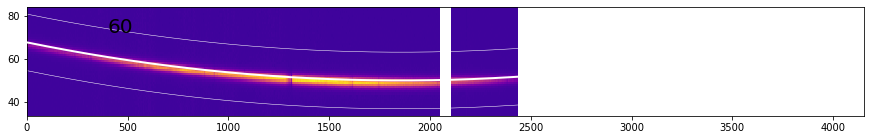

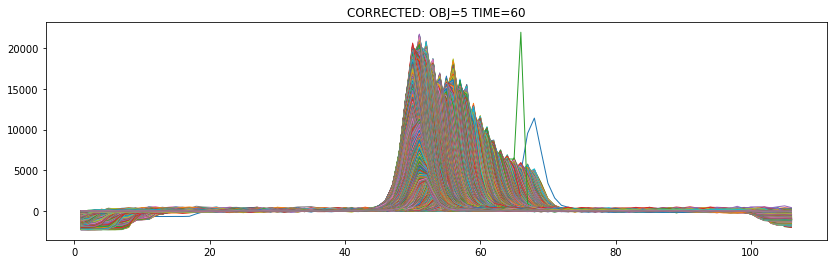

***  61  ***
***  62  ***
***  63  ***
***  64  ***
***  65  ***
***  66  ***
***  67  ***
***  68  ***
***  69  ***
       *** TIME:  70  ***


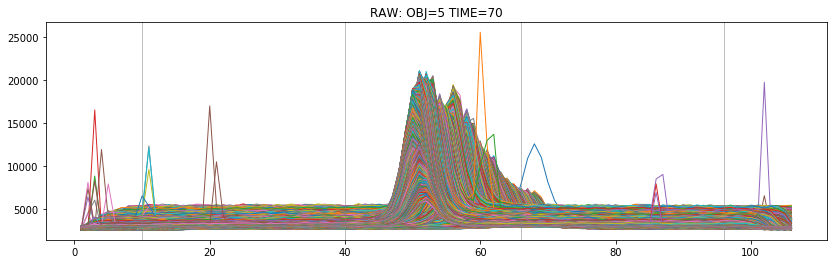

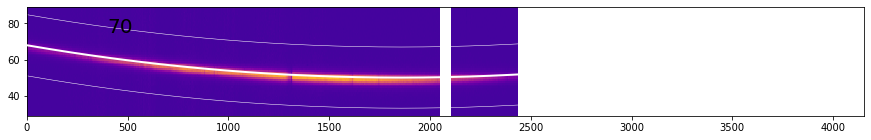

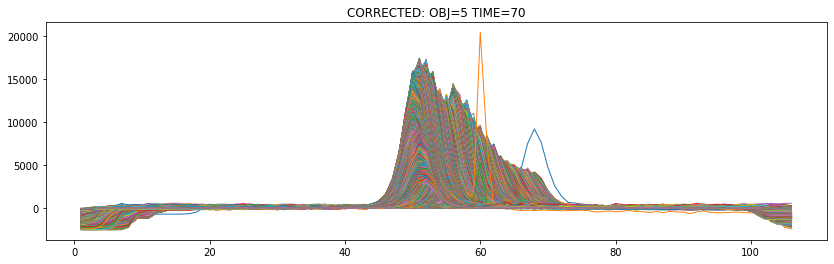

***  71  ***
***  72  ***
***  73  ***
***  74  ***
***  75  ***
***  76  ***
***  77  ***
***  78  ***
***  79  ***
       *** TIME:  80  ***


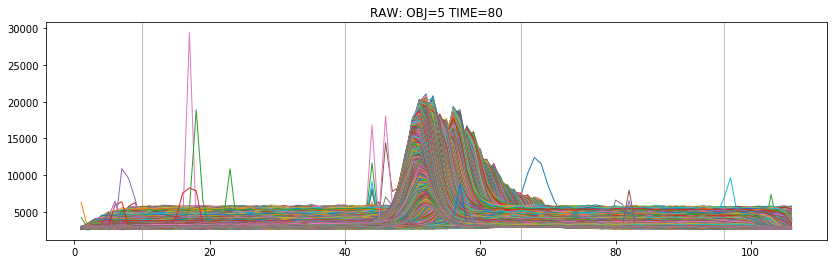

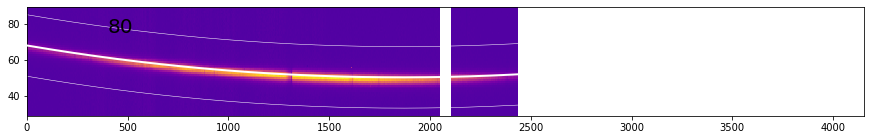

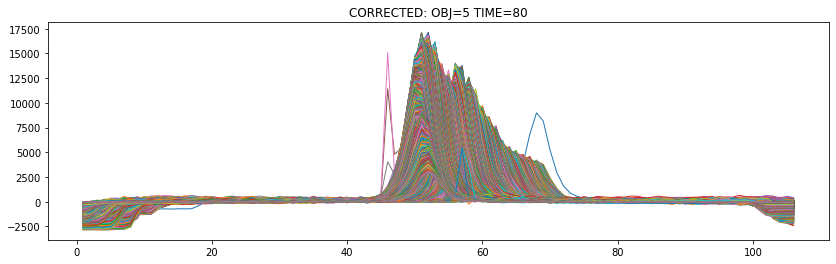

***  81  ***
***  82  ***
***  83  ***
***  84  ***
***  85  ***
***  86  ***
***  87  ***
***  88  ***
***  89  ***
       *** TIME:  90  ***


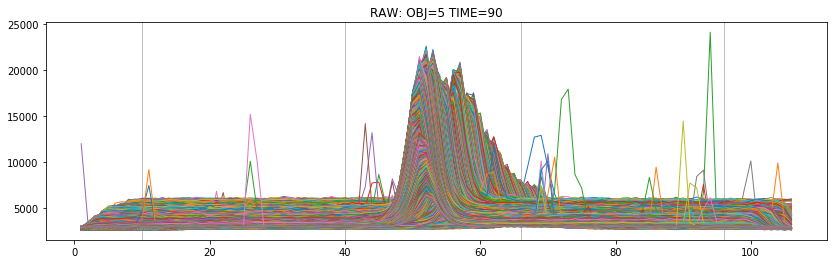

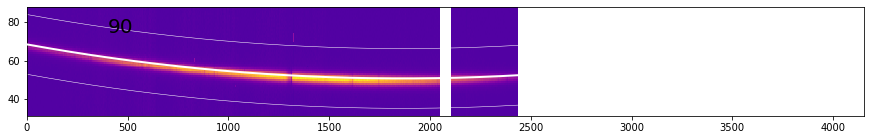

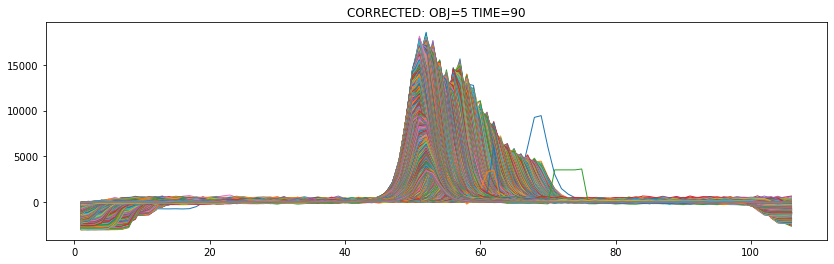

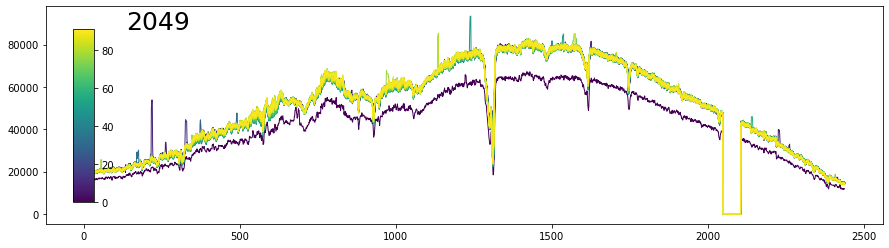

0:12:55.396900
---- reloading in previously run targets
          0
          1
          2
          3
          4
          5
---- saving data


In [4]:
from m3_FlattenSpec import FlattenSpec


#60 for Hats-8
#70 for else
ed_l=80/binnx#45#80/binn     #lower edge between background/data
ed_u=80/binnx#35#120/binn    #upper edge between background/data (width minus this value)
ed_t=10         #edges to trim

Lflat=False     #flats/darks arent' actually used here. Ignore these  #Logical switch to apply flats or not.
Ldark=False

CON=False   #constant aperture in time
LVAR=False  #let aperture vary with wavelength

ks_b=9 #9 for 2x2, up to 29 for 1x1     #kernel size for bakground outlier replacement. should be large (at least 15)
sig_b=4.               #sigma outlier threshold, background
o_b=2                  # order of polynomial fit to the data, CURRENTLY NOT USED - DEFAULT IS 2nd order

nruns=3             #number of times to run median filter.

ks_d=7 #7 for 1x1    #kernel size for data area outlier replacement. shoudl be small (default 7)
sig_d=4  #sigma outlier threshold, data. generally around 3.5, too low, too many flagged and vice versa

ks_s=5 #7 for 1x1   #kernel for spec
sig_s=4  #sig for spec

a_s=4    #aperture size (a_s*fwhm=aperture)
a_d=6    #inner app for corr   ----- UNUSED CURRENTLY
ing_fwhm=4./binnx   #initial guess on fwhm

ver_full=True #Plots cuts of 2D spectra, useful intially
ver_fit=False #plot function fits every 10 exposures, 100 rows -- LOTS OF PLOTS
ver_spec=True #plot spectra for each object, recommended
ver_xcen=True #plot x-center fit, recommended

data_corr=False    #corrections along data gauss

time_start=0
time_trim=0
obj_skip=[0]
reloadd=True #if true, reloads data from all objects before saving final plot
saver=True #if true, saves full arrays. If above is true, reloads in all objects before saving
r_skip=[]

fb=1  #Hats8b night 2 has fb=2, all others should be 1

FlattenSpec(extray,SAVEPATH,ed_l,ed_u,ed_t,binnx,binny,fb,Lflat,Ldark,CON,LVAR,
                ks_b,sig_b,ks_d,sig_d,ks_s,sig_s,ing_fwhm,ver_full,ver_fit,ver_spec,ver_xcen,
                data_corr,nruns,time_start,time_trim,obj_skip,reloadd,saver,r_skip,a_s,a_d)

4096 2 2048.0


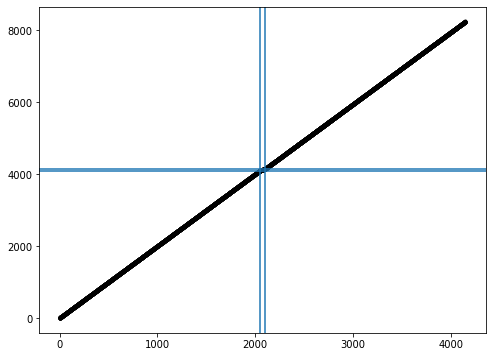

4096 2 2048.0


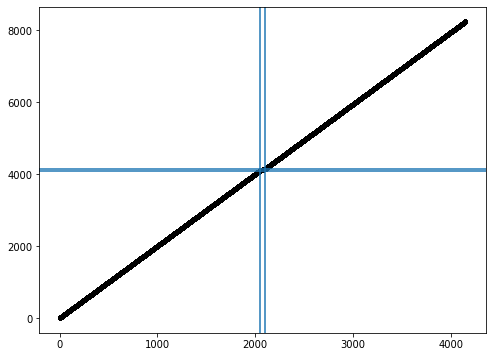

[0.000e+00 2.000e+00 4.000e+00 ... 8.243e+03 8.245e+03 8.247e+03]
[8.247e+03 8.245e+03 8.243e+03 ... 4.000e+00 2.000e+00 0.000e+00]
-----------------
  OBJECT #  0
-----------------


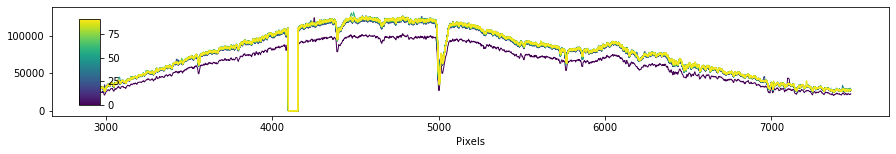

 --Filtering...
       -->> 8.758241758241759 797


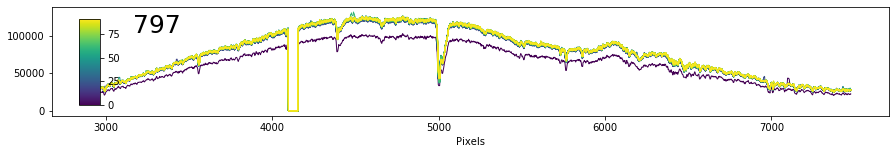

 --Oversampling...


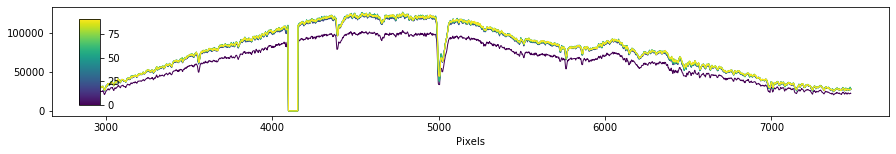

 --Convolving with Gaussian...
[3.49969532 3.57789081 3.84102756 3.75111572 3.71561717 4.11111622
 3.64441533 3.45611452 3.43536352 3.39341939 3.79595642 3.91294792
 3.93841969 3.66196716 4.06582417 3.80270915 3.87886168 3.82321004
 4.35742446 4.2723838  3.68963176 4.03125143 3.38942528 3.76477016
 3.4623138  3.52760623 3.69887525 4.52181831 4.17591152 3.95969491
 3.8521514  4.19792904 3.59879706 3.86719927 3.82196734 3.2417668
 3.16762089 3.46333405 3.23249038 3.51283375 3.81024605 3.69712422
 3.76964972 3.11765735 3.00431792 2.9055235  2.80483092 2.66569732
 2.79787571 3.00208108 2.84300978 3.40529347 3.56658117 3.64813728
 3.52922763 3.1735645  3.48145595 3.57163595 3.60529188 3.43760453
 3.0425048  3.21505197 3.40161353 2.9859215  3.48120091 3.0305847
 3.29703404 4.21034078 4.13317294 3.82649098 3.92439167 3.65884467
 3.92809958 3.56787547 3.36817317 3.44927386 3.70813823 4.06197759
 3.78740205 4.01292915 3.9344435  3.75023868 3.61498887 3.50536712
 3.13458611 3.12169206 3.0888894 

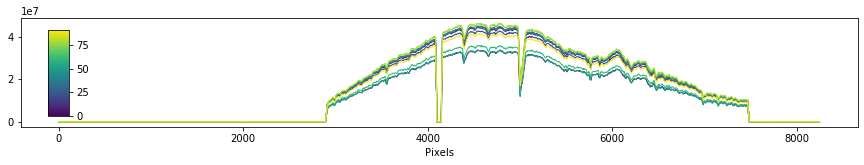

 --Cross Correlating in Time...
[ 7.71480774e+01  2.67038653e+00 -8.88576759e-04  2.13609048e-07
 -2.54338581e-11  1.18920824e-15]
[ 991.23359 2004.9381  2336.85259 2593.62181 2701.48958 3106.59962
 3549.37754 3610.90588 3723.99453 3783.32276 3889.01385 4004.09571
 4091.93786 4169.32143 4234.60893 4561.05062 4739.84208 4912.34381
 5290.17323 5344.31884 5425.9891  5547.73486 5677.04972 5754.94589]
[3888.58943 4471.16324 4713.10583 4922.18205 5016.10227 5401.44013
 5875.75497 5945.14209 6074.3521  6142.90772 6266.10482 6401.55106
 6505.62866 6597.7116  6675.62734 7067.17533 7282.46405 7490.64815
 7949.04734 8015.12935 8115.0444  8264.54213 8424.14099 8520.6851 ]
6563.0 6572.023636769588
5896.0 5886.338581292998
6572.023636769588 : 204344.0 206457.0
5886.338581292998 : 236690.0 238031.0
[-0.005 -0.005 -0.005 -0.03  -0.005 -0.005 -0.005 -0.005 -0.005 -0.005
 -0.005 -0.005 -0.005 -0.005 -0.005 -0.005 -0.005 -0.005 -0.005 -0.005
 -0.005 -0.005 -0.005  0.05   0.02   0.     0.005 -0.005 -0.005

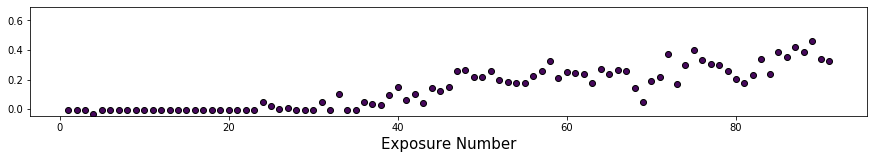

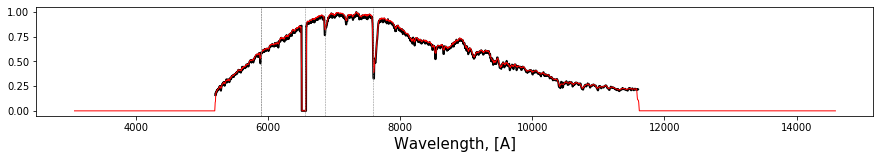

-----------------
  OBJECT #  1
-----------------


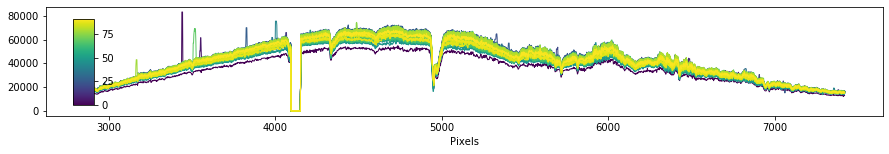

 --Filtering...
       -->> 5.164835164835165 470


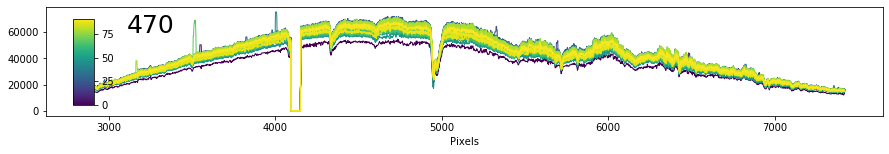

 --Oversampling...


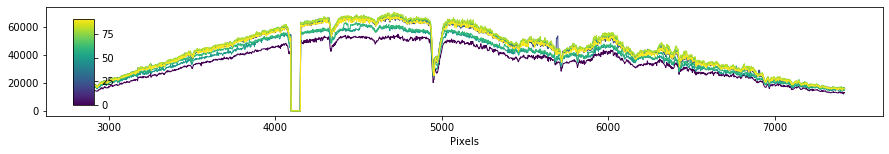

 --Convolving with Gaussian...
[4.03585548 4.13291007 4.75899173 4.53291583 4.35719936 5.50439512
 4.21738768 3.89573268 3.87297129 3.77932504 4.62712209 4.91781433
 5.01373218 4.31003637 5.43316132 4.58845674 4.82870164 4.71360041
 6.18601694 5.99930139 4.38811887 5.32279622 3.72788373 4.58093058
 3.91566202 4.01362208 4.35967788 6.51058123 5.65329158 5.05991236
 4.7507383  5.78248425 4.18178384 4.84230937 4.74372867 3.53072443
 3.4017883  3.93501278 3.46646967 3.96615999 4.68227325 4.38340397
 4.61370868 3.38342782 3.18807909 3.05582465 2.94160725 2.77716191
 2.9330021  3.21244774 3.01533397 3.83142778 4.18041526 4.3127286
 3.96718508 3.45928382 3.96982539 4.1653243  4.23223352 3.88069694
 3.25837949 3.49581455 3.79717738 3.15864293 3.98321967 3.22761539
 3.66765063 5.88861878 5.68229467 4.74930049 4.97606776 4.25377644
 4.99157125 4.0725065  3.74712629 3.84060258 4.46185028 5.4475454
 4.65386591 5.28641231 5.05438892 4.58375497 4.24764071 4.03186437
 3.42891131 3.40891402 3.36466375

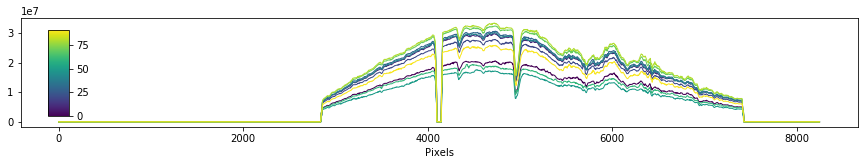

 --Cross Correlating in Time...
[-1.01132164e+03  3.95207969e+00 -1.51873820e-03  3.67275732e-07
 -4.40693574e-11  2.09179563e-15]
[ 313.6866  1691.3508  2111.83861 2424.15878 2551.77778 3011.98773
 3484.30011 3547.96354 3664.04822 3724.53338 3831.70748 3947.7387
 4035.96238 4113.5064  4178.83767 4504.99396 4683.68488 4856.28485
 5235.07586 5289.44367 5371.49507 5493.93276 5624.20431 5702.83173]
[3888.58943 4471.16324 4713.10583 4922.18205 5016.10227 5401.44013
 5875.75497 5945.14209 6074.3521  6142.90772 6266.10482 6401.55106
 6505.62866 6597.7116  6675.62734 7067.17533 7282.46405 7490.64815
 7949.04734 8015.12935 8115.0444  8264.54213 8424.14099 8520.6851 ]
6563.0 6577.998652390943
5896.0 5895.36576417162
6577.998652390943 : 208781.0 210886.0
5895.36576417162 : 239693.0 241092.0
[-5.000e-03 -2.950e-01 -5.000e-03 -5.000e-03  2.300e-01 -8.300e-01
 -1.395e+00 -2.650e-01 -1.000e-02  3.600e-01  1.650e-01  5.000e-03
 -5.000e-03 -1.400e-01 -1.175e+00 -5.000e-03 -6.850e-01 -4.450e-01
 -8.325

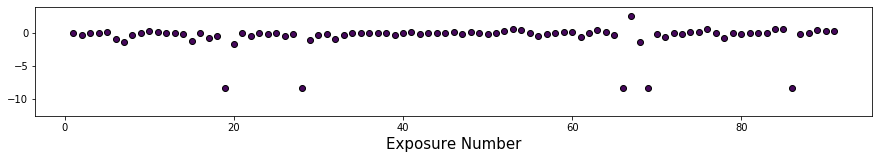

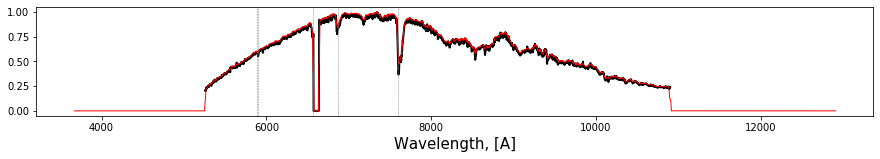

-----------------
  OBJECT #  2
-----------------


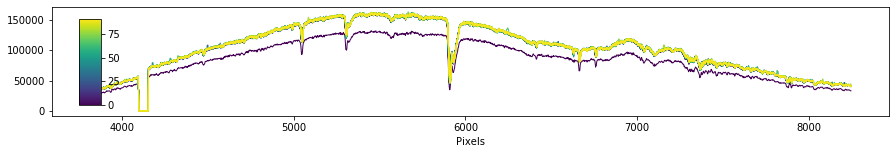

 --Filtering...
       -->> 12.923076923076923 1176


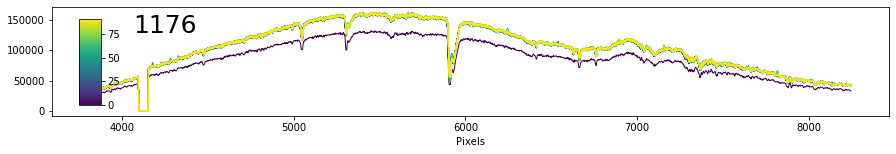

 --Oversampling...


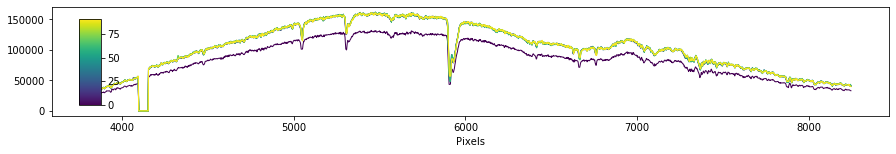

 --Convolving with Gaussian...
[3.47368315 3.54709797 3.83756939 3.72068834 3.68863525 4.10195255
 3.62939137 3.44310271 3.40196109 3.40201358 3.75250774 3.91938826
 3.89387866 3.64247405 4.04852876 3.76677823 3.84723483 3.87218604
 4.35256877 4.27000346 3.67296125 4.03581094 3.37763455 3.7635778
 3.46943633 3.51843007 3.72854301 4.54467264 4.18045844 3.96998939
 3.83118803 4.20108972 3.57770026 3.88368671 3.8051304  3.23248364
 3.16095054 3.44448175 3.22431623 3.48955193 3.82380333 3.68074466
 3.7352826  3.08898874 2.95882791 2.88349822 2.75210821 2.6169284
 2.7528904  2.96200712 2.79115591 3.34330804 3.51558969 3.60341562
 3.47756759 3.07560058 3.41388894 3.52222694 3.52584931 3.38162798
 2.97372675 3.11338991 3.34945106 2.91791637 3.42756232 2.93097423
 3.23749842 4.12125432 4.08938334 3.76863601 3.84081703 3.63381668
 3.89187879 3.50674431 3.32321545 3.38829077 3.65802997 3.98713682
 3.73930756 3.96515643 3.8958391  3.70127833 3.59552805 3.485111
 3.0952879  3.07436777 3.02772939 2

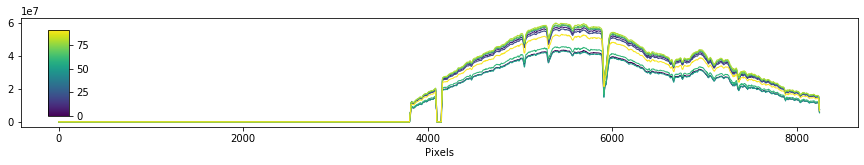

 --Cross Correlating in Time...
[ 2.11594344e+03  1.15550697e+00 -9.29343314e-05  1.10529607e-08
 -5.03096994e-13]
[2550.83659 3159.066   3398.44646 3599.92546 3688.9396  4045.48748
 4468.06755 4528.6202  4640.62934 4699.67558 4805.18822 4920.33899
 5008.28063 5085.71307 5150.97973 5475.92951 5652.82051 5822.93695
 6195.11619 6248.56241 6329.29162 6449.94544 6578.58009 6656.32394]
[3888.58943 4471.16324 4713.10583 4922.18205 5016.10227 5401.44013
 5875.75497 5945.14209 6074.3521  6142.90772 6266.10482 6401.55106
 6505.62866 6597.7116  6675.62734 7067.17533 7282.46405 7490.64815
 7949.04734 8015.12935 8115.0444  8264.54213 8424.14099 8520.6851 ]
6563.0 6551.30325504706
5896.0 5883.358242836036
6551.30325504706 : 159410.0 160672.0
5883.358242836036 : 188017.0 189330.0
[-0.0025 -0.0175 -0.1325 -0.0225 -0.0875 -0.1225 -0.0075 -0.0425 -0.1025
  0.0925 -0.0325 -0.0525  0.0325  0.0075  0.0325  0.0025  0.0325  0.0425
 -0.0225 -0.0425  0.0325  0.0225  0.0925  0.0475  0.1325  0.1525  0.2275
 -0.

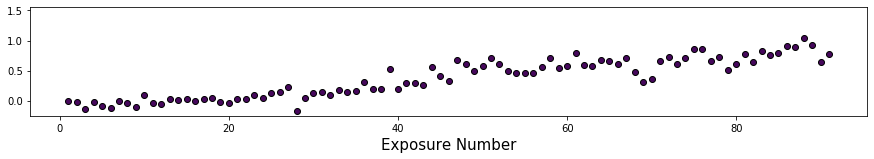

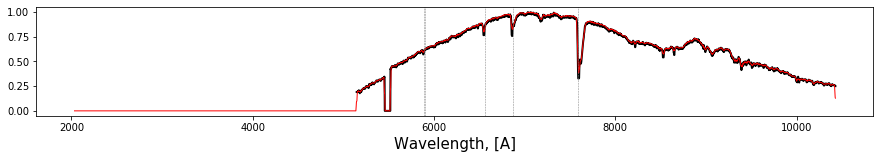

-----------------
  OBJECT #  3
-----------------
--------- BAD WAVELENGTH SOLUTION
-----------------
  OBJECT #  4
-----------------
--------- BAD WAVELENGTH SOLUTION
-----------------
  OBJECT #  5
-----------------
--------- BAD WAVELENGTH SOLUTION


In [2]:
# to run this cell, you must have the wavelength solution text files
from m4_AlignSpec import func_gaus
from m4_AlignSpec import AlignSpec

gris=300  #lines/mm grism
osr=100.  #oversampling rate


fwhm_gauss=5                    #Convolving gaussian FWHM in pixels
                    #if next input is TRUE, uses FWHM from fits to determine convolution function

ks=7#15   #kernel size for smoothing of spectra to detect outliers
olv=5.

path0='/Volumes/ermay_ext/Magellan/'+obs_date+'/'
wavelength_path0=path+'WaveSolution_'+obj_name+'/'

obj_skip=[3,4,5]


time_trim=0  # number of last exposures to ignore (6 for WASP4b)
ver=False   #verbose output toggle. plots lines used for y-shifts every 10 exposures.
ver_l=False  #prints line shift info every 10 exposures


Aligned=AlignSpec(gris,osr,fwhm_gauss,True,ks,olv,wavelength_path0,obj_name,SAVEPATH,extray,binny,ver,ver_l,time_trim,obj_skip)

del Aligned




  -->> From Lambda= 5300  to Lambda= 9100
  -->> TOTAL OF  19 WAVELENGTH BINS
       Bin Centers:  [5400. 5600. 5800. 6000. 6200. 6400. 6600. 6800. 7000. 7200. 7400. 7600.
 7800. 8000. 8200. 8400. 8600. 8800. 9000.]
       Bin Array:    [5300. 5500. 5700. 5900. 6100. 6300. 6500. 6700. 6900. 7100. 7300. 7500.
 7700. 7900. 8100. 8300. 8500. 8700. 8900. 9100.]
       Bin Width:    200
[5400. 5600. 5800. 6000. 6200. 6400. 6600. 6800. 7000. 7200. 7400. 7600.
 7800. 8000. 8200. 8400. 8600. 8800. 9000.]
 ********** 0 ********** 
5300.0 9100.0
5014.508563941054 9708.920669393532


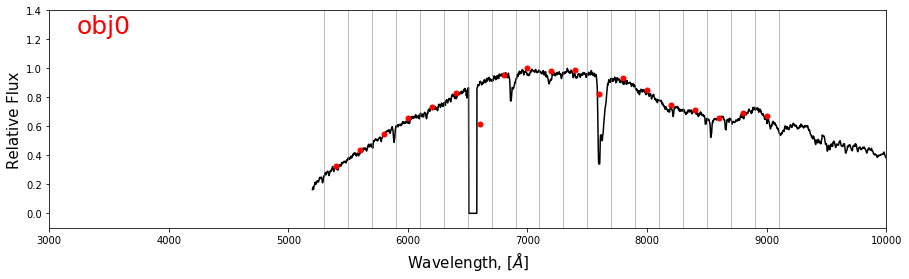

 ********** 2 ********** 
5300.0 9100.0
4985.5914277314205 9637.97346359641


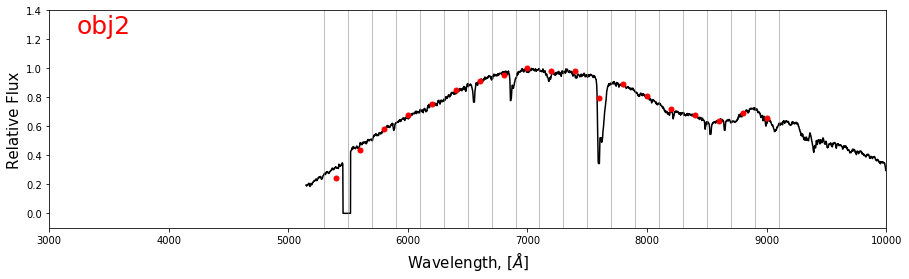

In [13]:
### BUG TO FIX -- allow for half spectra 

from m5_Bin_SpectRes import BinWhite
from m5_Bin_SpectRes import BinLam

#200,100,50,40,30,20,15

start=5300
end=9100#7800
width=200

obj_skip=[1,3,4,5]


#Test=BinWhite(SAVEPATH,midtime,start,end,obj_skip,binny)
Test2=BinLam(SAVEPATH,midtime,start,end,width,obj_skip,binny,100)

In [2]:
from m6_NoiseModel_Inputs import NoiseModel_Inputs

width=200

NoiseModel_Inputs(SAVEPATH,width)

[5400. 5600. 5800. 6000. 6200. 6400. 6600. 6800. 7000. 7200. 7400. 7600.
 7800. 8000. 8200. 8400. 8600. 8800. 9000.]
5300.0 9100.0 200.0 19
(6, 91, 4153)
91 6
0
1
2
3
4
5


<Figure size 432x288 with 0 Axes>

(6, 91)
3273.243361807808


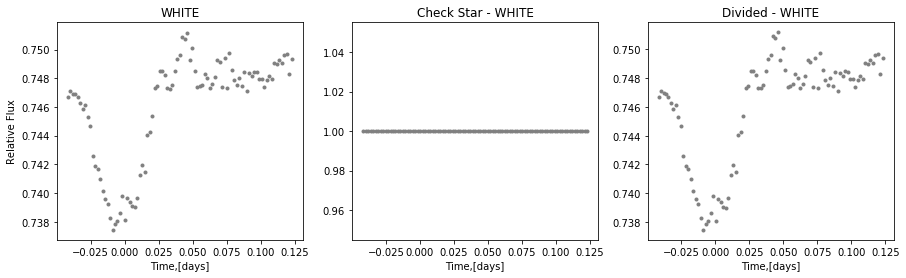

[5300. 5500. 5700. 5900. 6100. 6300. 6500. 6700. 6900. 7100. 7300. 7500.
 7700. 7900. 8100. 8300. 8500. 8700. 8900. 9100.]
(6, 91, 19)
7312.109507926108


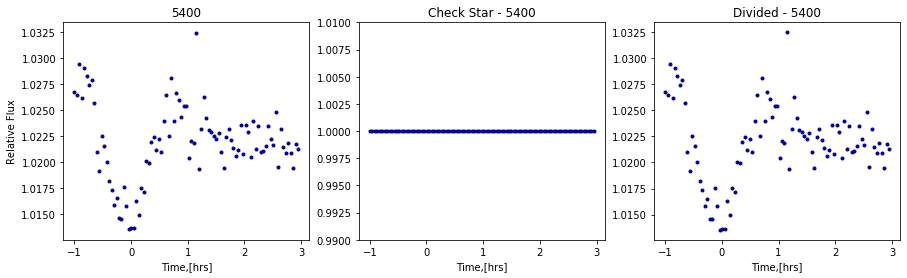

4457.34857102598


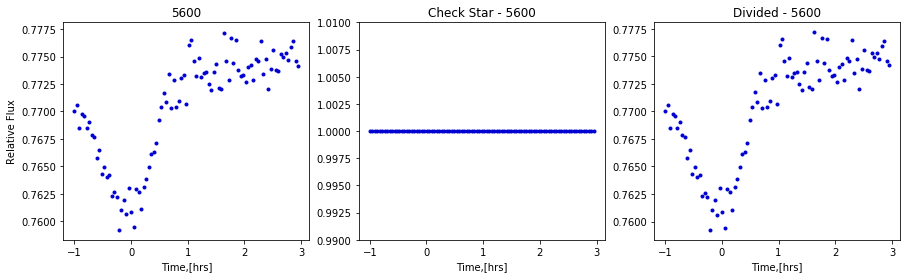

3684.2826426029333


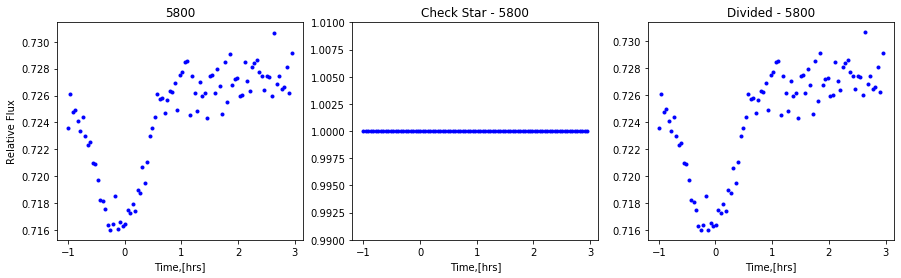

3472.8539985106513


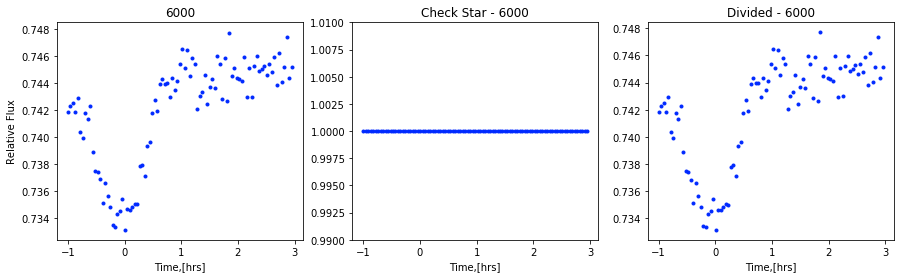

3293.545538587954


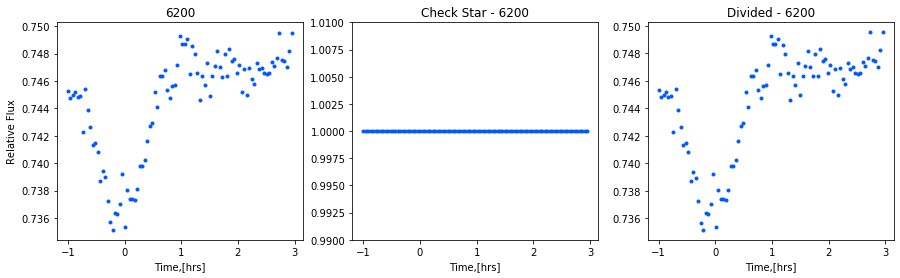

3134.7037112949993


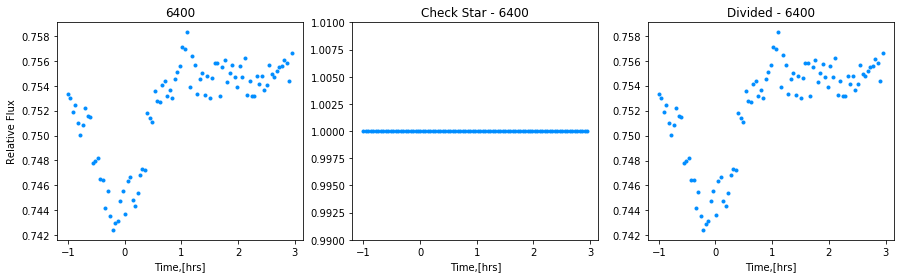

2314.2837928844506


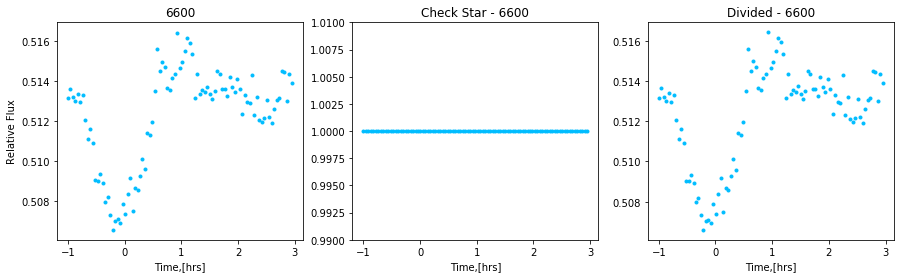

2986.851977265038


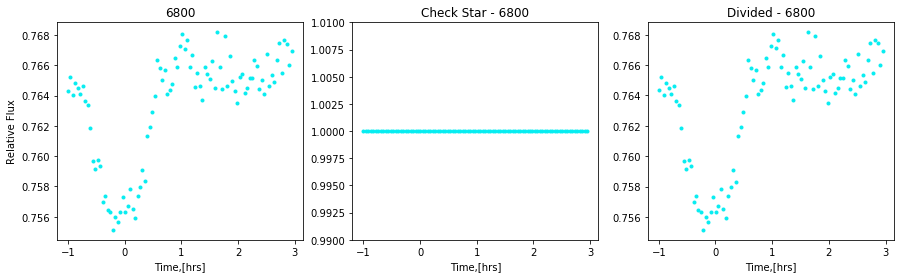

2928.7983912658974


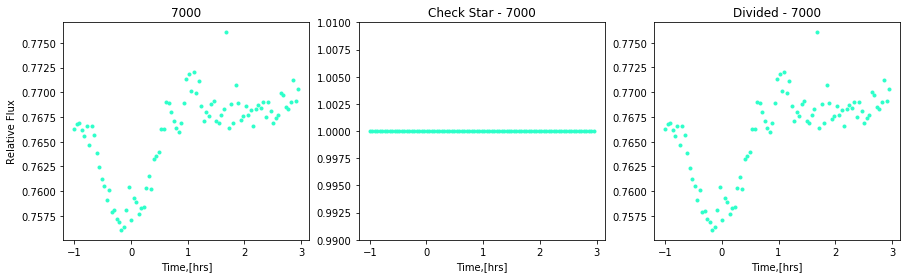

2959.802935622853


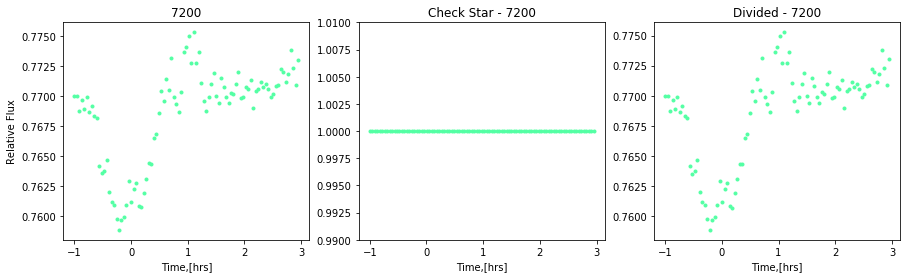

2986.858427821741


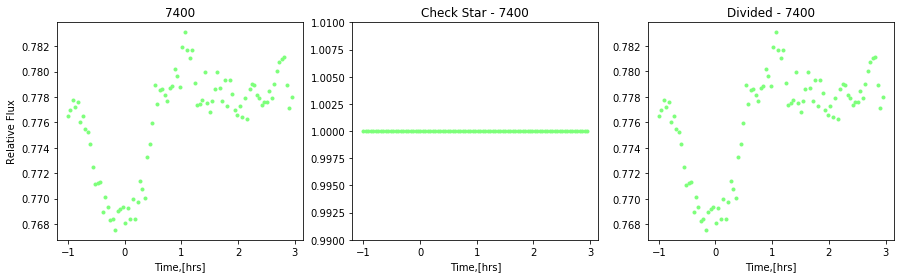

3350.832163339902


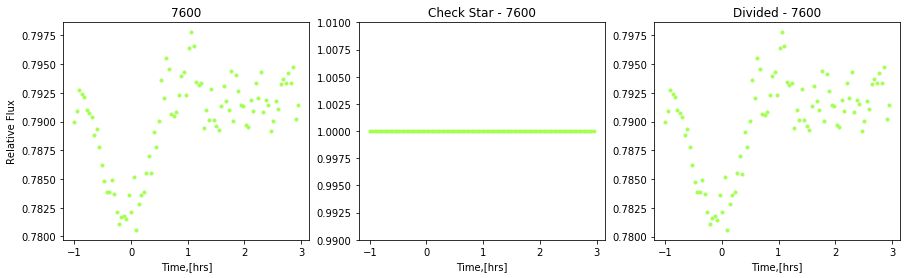

3201.393322681326


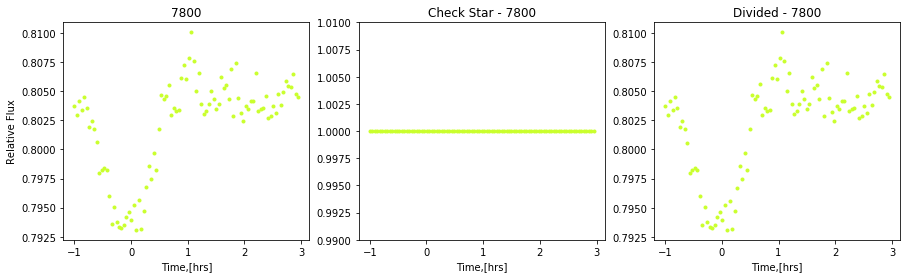

3345.583322907105


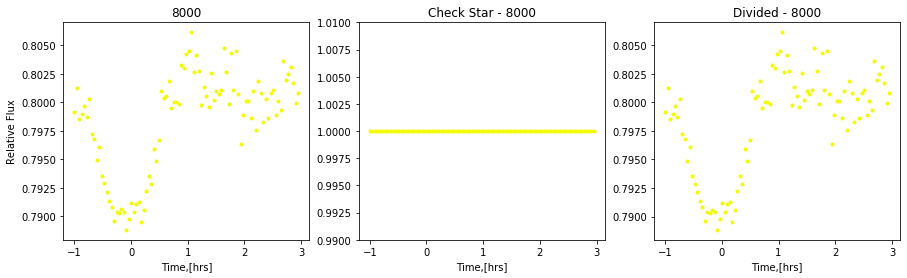

3569.441387853441


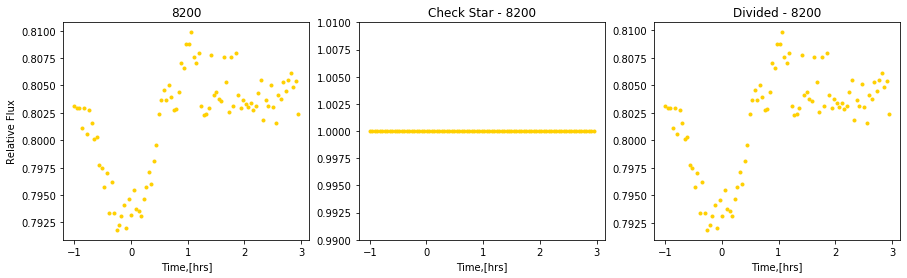

3681.3164155204267


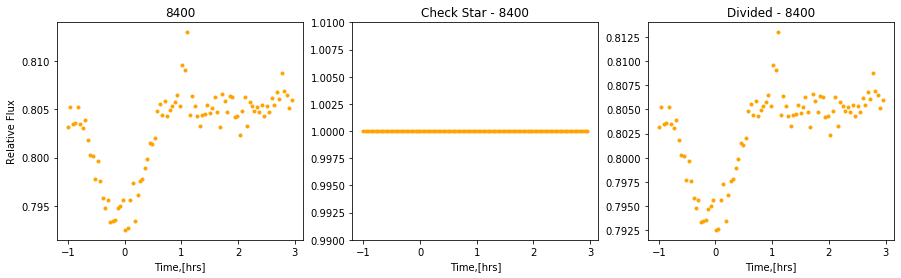

3775.33209090912


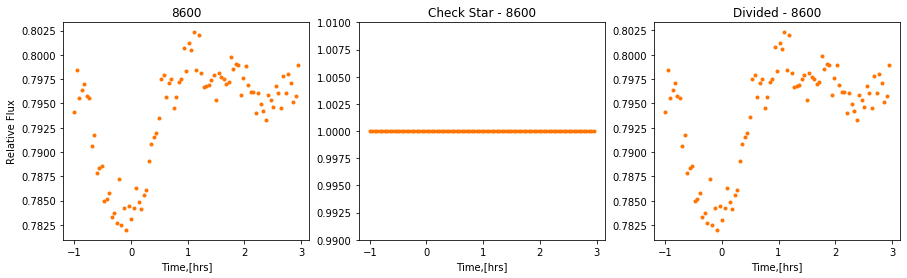

3506.4942413766917


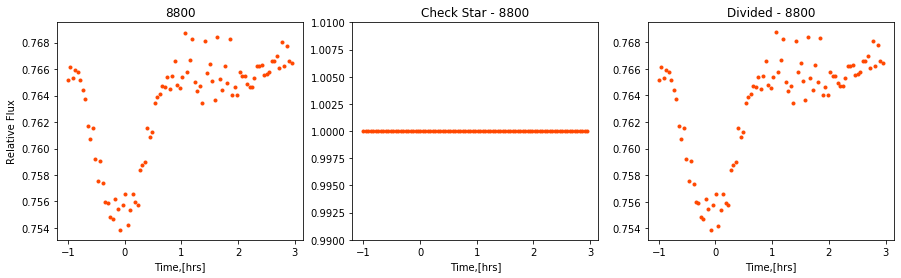

3683.182212894849


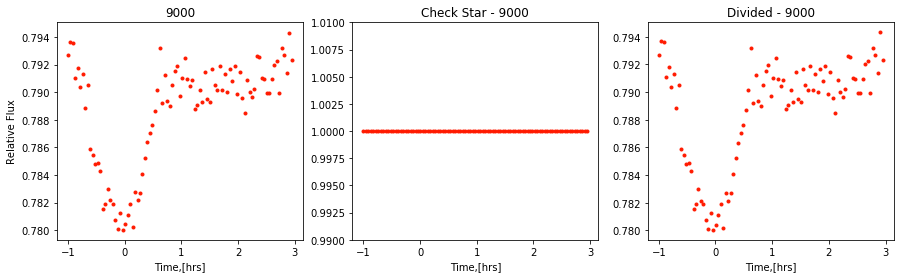

In [16]:
from m6_GenerateLC import LCgen_binns,LCgen_white

corr=False   #Use Red Noise Corrected
width=200

#Hats34
# 1  2  3  4  5  6  
# X

Cals_ind=[2]
csn=2



white=LCgen_white(SAVEPATH,corr,Cals_ind,csn)
binns=LCgen_binns(SAVEPATH,width,corr,Cals_ind,csn)

